In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
# Convert field names to dict for easy access.
# Can be hard coded 
# 
fields_path = '../../input/training_validation_2/fields.csv'  
fields_df = pd.read_csv(fields_path)
fields_df.columns = ['name', 'f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6']

fields_dict = {}
fields_dictv2 = {}

for idx in range(fields_df.shape[0]):
    name = fields_df.loc[idx, 'name']

    _fields = []
    
    for f in fields_df.columns[1:]:
        if not (str(fields_df.loc[idx, f]) == 'nan'):
            _fields.append(name + "_" + str(fields_df.loc[idx, f]))
    
    fields_dict[idx] = {'name': fields_df.loc[idx, 'name'] , 'fields': _fields}
    fields_dictv2[name] = _fields
    
# fields_dict

In [3]:
feature_list = [fields_dict[15]['name']]
feature_list_regex= "|".join(["^"+f+"_" for f in feature_list])

feature_list

['FuseHeatSlope']

In [4]:
# import data
data_df_1 = pd.read_csv("../../data/training_validation_1.csv")
data_df_2 = pd.read_csv("../../data/training_validation_2.csv")
merged_df = pd.concat([data_df_1, data_df_2], axis=0) # Merge data frames


In [5]:
train_df = merged_df.filter(regex=feature_list_regex)
# train_df = train_df.filter(regex="vCnt|value")
# train_df = data_df_2.filter(regex="^Temperature")

In [6]:
train_df.head()

,FuseHeatSlope_vCnt,FuseHeatSlope_vFreq,FuseHeatSlope_vMax,FuseHeatSlope_vMin,FuseHeatSlope_vStd,FuseHeatSlope_vTrend,FuseHeatSlope_value
0,0,0.000000,NaN,NaN,NaN,NaN,NaN
1,2,0.198207,0.104286,0.014899,0.044693,0.089387,0.059593
2,3,0.296778,0.226774,0.079115,0.062324,-0.053702,0.164136
3,3,0.298541,0.754979,0.106084,0.283907,0.053925,0.502731
4,3,0.298554,0.739536,0.093362,0.295388,0.020576,0.322471


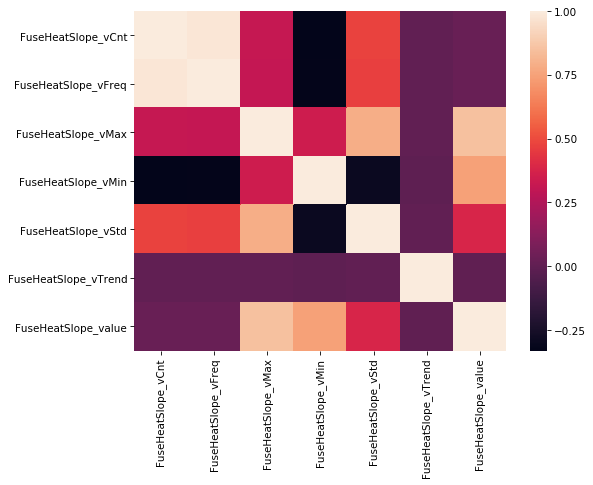

In [7]:
fig = plt.figure(figsize=(8,6), dpi=75)
sns.heatmap(train_df.corr(),annot=False)

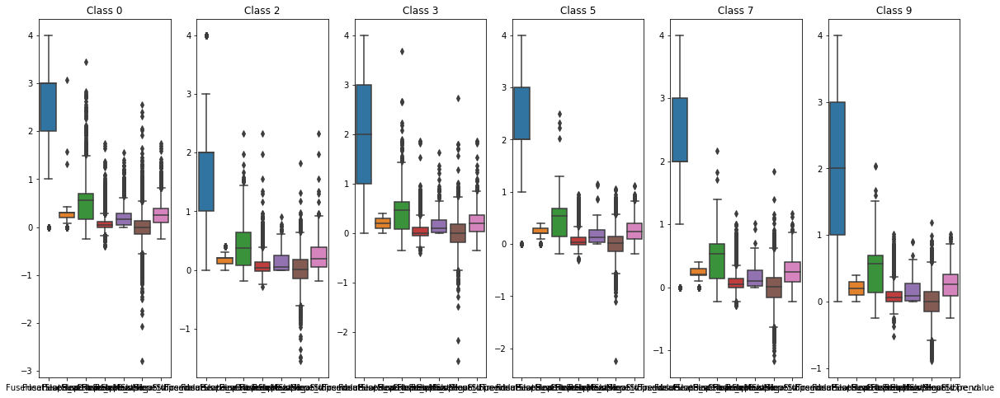

In [8]:
# fig = plt.figure(figsize=(10, 8), dpi=75)


classes = data_df_2['class'].unique()

fig, axes = plt.subplots(1, len(classes), sharex=True, figsize=(20,8))
# fig.suptitle('1 row x 2 columns axes with no data')

for idx, c in enumerate(classes):
    df = train_df[merged_df['class'] == c].copy()
#     df = train_df.copy()
    sns.boxplot(data=df, ax=axes[idx])
    axes[idx].set_title('Class '+str(c))


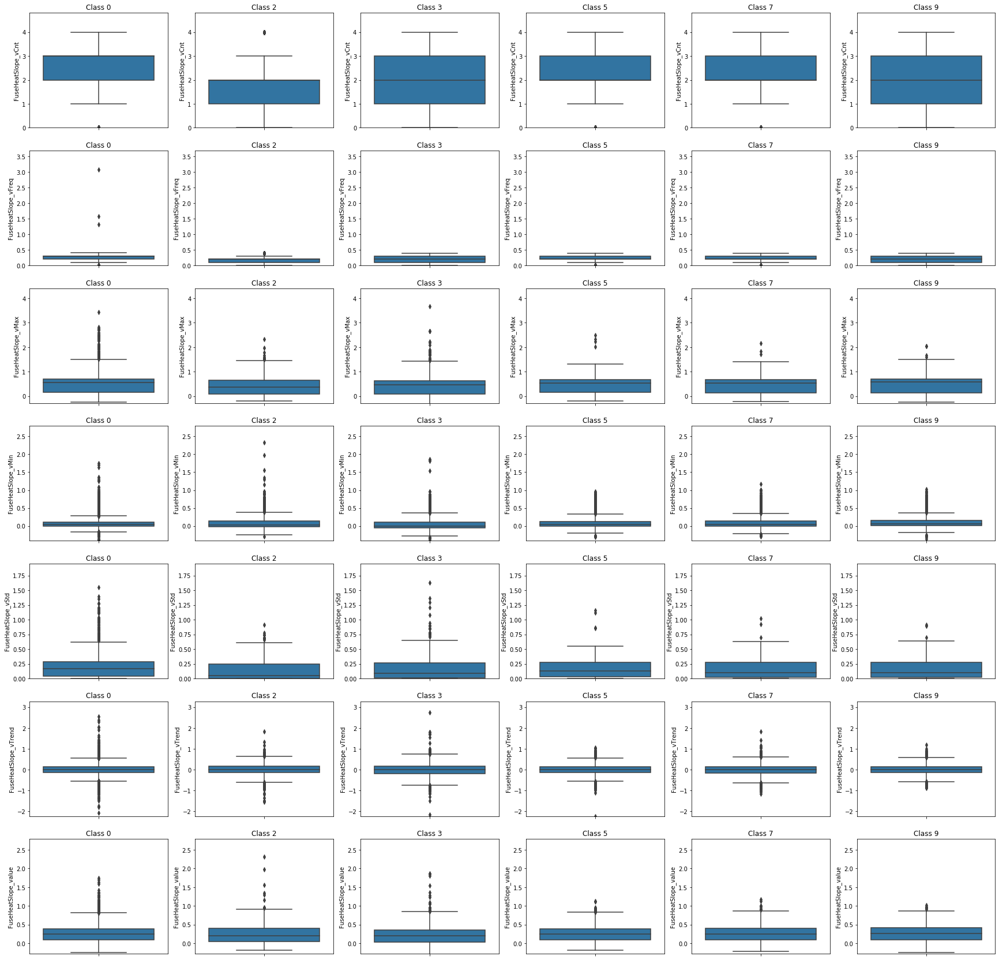

In [9]:
# fig = plt.figure(figsize=(10, 8), dpi=75)


classes = data_df_2['class'].unique()
features = train_df.columns

fig, axes = plt.subplots(len(features), len(classes), sharex=True, figsize=(30,30))
# print (axes)
# fig.suptitle('1 row x 2 columns axes with no data')

for idx1, f in enumerate(features):
    df = merged_df[[f, 'class']].copy()
    for idx2, c in enumerate(classes):
        df2 = df[df['class'] == c].copy()
#         print (f, c, df2.columns)
        sns.boxplot(y=df2[f], ax=axes[idx1, idx2])
        axes[idx1, idx2].set_title('Class '+str(c))
        axes[idx1, idx2].set_ylim(0.8*df[f].min(), 1.2*df[f].max())


In [10]:
# classes = data_df_2['class'].unique()
# features = train_df.columns

# fig, axes = plt.subplots(len(features), 1, sharex=True, figsize=(30,16))

# for idx1, f in enumerate(features):
#     df = data_df_2[[f, 'class']].copy()
#     axes[idx1].set_title('Feature '+str(f))
#     for idx2, c in enumerate(classes):
#         df2 = df[df['class'] == c].copy()
#         axes[idx1].boxplot(x=df2[f], positions=[idx2], labels=[c])
    


In [11]:
# train_df2 = pd.concat([data_df_2['class'], train_df], axis=1)
# axes = train_df2.groupby('class').boxplot(figsize=(20, 10))

In [12]:
classes = data_df_2['class'].unique()
features = train_df.columns

new_df = pd.DataFrame()

df_list = []

for idx1, f in enumerate(features):
    df = merged_df[[f, 'class']].copy()
    data = [[
        99, f, df[f].max(), df[f].min(), df[f].std(), df[f].mean(), df[f].median(), df[f].count(), df[f].isna().sum(),
        ]]

    data_df = pd.DataFrame(data)

    df_list.append(data_df)

    for idx2, c in enumerate(classes):
        df2 = df[df['class'] == c].copy()

        data = [[
            c, f, df2[f].max(), df2[f].min(), df2[f].std(), df2[f].mean(), df2[f].median(), df2[f].count(), df2[f].isna().sum(),
            ]]
        
        data_df = pd.DataFrame(data)
        df_list.append(data_df)
        
new_df = pd.concat(df_list, axis=0)
        
new_df.columns = ['class', 'feature', 'max', 'min', 'std', 'mean', 'median', 'Count', 'NA_count']

In [13]:
new_df[new_df['class']==99]

,class,feature,max,min,std,mean,median,Count,NA_count
0,99,FuseHeatSlope_vCnt,4.000000,0.000000,0.979323,2.217919,2.000000,39611,0
0,99,FuseHeatSlope_vFreq,3.075076,0.000000,0.098889,0.220847,0.199333,39611,0
0,99,FuseHeatSlope_vMax,3.672169,-0.354847,0.307225,0.444068,0.546697,36863,2748
0,99,FuseHeatSlope_vMin,2.323400,-0.518009,0.195916,0.096320,0.041049,36863,2748
0,99,FuseHeatSlope_vStd,1.625774,0.000000,0.137591,0.158703,0.130096,36863,2748
0,99,FuseHeatSlope_vTrend,2.730872,-2.791173,0.311926,0.001490,0.002656,31296,8315
0,99,FuseHeatSlope_value,2.323400,-0.354847,0.208493,0.259366,0.241314,36863,2748


In [14]:
missing = 0

for c in classes:
    class_df = merged_df[merged_df['class']==c]
    runs = class_df['run'].unique()
    for r in runs:
        run_df = class_df[class_df['run'] == r]
        for f in features:
            f_df = run_df.filter([f]).copy().reset_index()
            del f_df['index']
            l = len(f_df)
            n_df = f_df[f_df[f].isna()]
#             if len(f_df) != len(n_df): print (c, r, f, len(f_df), len(n_df))
            if (len(n_df) == 0): continue
            missing += len(n_df)
            for i in list(n_df.index):
                if ((i == 0) | (i == l-1)): 
                    print ('NA at start or end')
                else:
                    print (c, r, f, len(f_df), list(n_df.index))
print (missing)

NA at start or end
0 0 FuseHeatSlope_vMax 361 [0, 185, 186, 221, 231, 234, 241, 243, 244, 252, 254, 255, 256, 263, 288, 292, 293, 319, 360]
0 0 FuseHeatSlope_vMax 361 [0, 185, 186, 221, 231, 234, 241, 243, 244, 252, 254, 255, 256, 263, 288, 292, 293, 319, 360]
0 0 FuseHeatSlope_vMax 361 [0, 185, 186, 221, 231, 234, 241, 243, 244, 252, 254, 255, 256, 263, 288, 292, 293, 319, 360]
0 0 FuseHeatSlope_vMax 361 [0, 185, 186, 221, 231, 234, 241, 243, 244, 252, 254, 255, 256, 263, 288, 292, 293, 319, 360]
0 0 FuseHeatSlope_vMax 361 [0, 185, 186, 221, 231, 234, 241, 243, 244, 252, 254, 255, 256, 263, 288, 292, 293, 319, 360]
0 0 FuseHeatSlope_vMax 361 [0, 185, 186, 221, 231, 234, 241, 243, 244, 252, 254, 255, 256, 263, 288, 292, 293, 319, 360]
0 0 FuseHeatSlope_vMax 361 [0, 185, 186, 221, 231, 234, 241, 243, 244, 252, 254, 255, 256, 263, 288, 292, 293, 319, 360]
0 0 FuseHeatSlope_vMax 361 [0, 185, 186, 221, 231, 234, 241, 243, 244, 252, 254, 255, 256, 263, 288, 292, 293, 319, 360]
0 0 FuseHeatS

NA at start or end
0 11 FuseHeatSlope_vTrend 361 [0, 1, 6, 22, 45, 94, 143, 144, 165, 230, 243, 341, 346, 360]
0 11 FuseHeatSlope_vTrend 361 [0, 1, 6, 22, 45, 94, 143, 144, 165, 230, 243, 341, 346, 360]
0 11 FuseHeatSlope_vTrend 361 [0, 1, 6, 22, 45, 94, 143, 144, 165, 230, 243, 341, 346, 360]
0 11 FuseHeatSlope_vTrend 361 [0, 1, 6, 22, 45, 94, 143, 144, 165, 230, 243, 341, 346, 360]
0 11 FuseHeatSlope_vTrend 361 [0, 1, 6, 22, 45, 94, 143, 144, 165, 230, 243, 341, 346, 360]
0 11 FuseHeatSlope_vTrend 361 [0, 1, 6, 22, 45, 94, 143, 144, 165, 230, 243, 341, 346, 360]
0 11 FuseHeatSlope_vTrend 361 [0, 1, 6, 22, 45, 94, 143, 144, 165, 230, 243, 341, 346, 360]
0 11 FuseHeatSlope_vTrend 361 [0, 1, 6, 22, 45, 94, 143, 144, 165, 230, 243, 341, 346, 360]
0 11 FuseHeatSlope_vTrend 361 [0, 1, 6, 22, 45, 94, 143, 144, 165, 230, 243, 341, 346, 360]
0 11 FuseHeatSlope_vTrend 361 [0, 1, 6, 22, 45, 94, 143, 144, 165, 230, 243, 341, 346, 360]
0 11 FuseHeatSlope_vTrend 361 [0, 1, 6, 22, 45, 94, 143, 144,

NA at start or end
0 23 FuseHeatSlope_vMax 364 [0, 1, 2, 3, 4, 173, 287, 363]
0 23 FuseHeatSlope_vMax 364 [0, 1, 2, 3, 4, 173, 287, 363]
0 23 FuseHeatSlope_vMax 364 [0, 1, 2, 3, 4, 173, 287, 363]
0 23 FuseHeatSlope_vMax 364 [0, 1, 2, 3, 4, 173, 287, 363]
0 23 FuseHeatSlope_vMax 364 [0, 1, 2, 3, 4, 173, 287, 363]
0 23 FuseHeatSlope_vMax 364 [0, 1, 2, 3, 4, 173, 287, 363]
NA at start or end
NA at start or end
0 23 FuseHeatSlope_vMin 364 [0, 1, 2, 3, 4, 173, 287, 363]
0 23 FuseHeatSlope_vMin 364 [0, 1, 2, 3, 4, 173, 287, 363]
0 23 FuseHeatSlope_vMin 364 [0, 1, 2, 3, 4, 173, 287, 363]
0 23 FuseHeatSlope_vMin 364 [0, 1, 2, 3, 4, 173, 287, 363]
0 23 FuseHeatSlope_vMin 364 [0, 1, 2, 3, 4, 173, 287, 363]
0 23 FuseHeatSlope_vMin 364 [0, 1, 2, 3, 4, 173, 287, 363]
NA at start or end
NA at start or end
0 23 FuseHeatSlope_vStd 364 [0, 1, 2, 3, 4, 173, 287, 363]
0 23 FuseHeatSlope_vStd 364 [0, 1, 2, 3, 4, 173, 287, 363]
0 23 FuseHeatSlope_vStd 364 [0, 1, 2, 3, 4, 173, 287, 363]
0 23 FuseHeatSlope_v

NA at start or end
0 27 FuseHeatSlope_vMin 361 [0, 241, 242, 246, 248, 250, 256, 360]
0 27 FuseHeatSlope_vMin 361 [0, 241, 242, 246, 248, 250, 256, 360]
0 27 FuseHeatSlope_vMin 361 [0, 241, 242, 246, 248, 250, 256, 360]
0 27 FuseHeatSlope_vMin 361 [0, 241, 242, 246, 248, 250, 256, 360]
0 27 FuseHeatSlope_vMin 361 [0, 241, 242, 246, 248, 250, 256, 360]
0 27 FuseHeatSlope_vMin 361 [0, 241, 242, 246, 248, 250, 256, 360]
NA at start or end
NA at start or end
0 27 FuseHeatSlope_vStd 361 [0, 241, 242, 246, 248, 250, 256, 360]
0 27 FuseHeatSlope_vStd 361 [0, 241, 242, 246, 248, 250, 256, 360]
0 27 FuseHeatSlope_vStd 361 [0, 241, 242, 246, 248, 250, 256, 360]
0 27 FuseHeatSlope_vStd 361 [0, 241, 242, 246, 248, 250, 256, 360]
0 27 FuseHeatSlope_vStd 361 [0, 241, 242, 246, 248, 250, 256, 360]
0 27 FuseHeatSlope_vStd 361 [0, 241, 242, 246, 248, 250, 256, 360]
NA at start or end
NA at start or end
0 27 FuseHeatSlope_vTrend 361 [0, 16, 26, 32, 93, 104, 130, 159, 181, 195, 239, 241, 242, 243, 245, 2

NA at start or end
0 31 FuseHeatSlope_vMin 362 [0, 1, 2, 37, 124]
0 31 FuseHeatSlope_vMin 362 [0, 1, 2, 37, 124]
0 31 FuseHeatSlope_vMin 362 [0, 1, 2, 37, 124]
0 31 FuseHeatSlope_vMin 362 [0, 1, 2, 37, 124]
NA at start or end
0 31 FuseHeatSlope_vStd 362 [0, 1, 2, 37, 124]
0 31 FuseHeatSlope_vStd 362 [0, 1, 2, 37, 124]
0 31 FuseHeatSlope_vStd 362 [0, 1, 2, 37, 124]
0 31 FuseHeatSlope_vStd 362 [0, 1, 2, 37, 124]
NA at start or end
0 31 FuseHeatSlope_vTrend 362 [0, 1, 2, 25, 29, 31, 36, 37, 74, 90, 97, 98, 103, 105, 106, 111, 112, 113, 119, 121, 122, 123, 124, 125, 128, 129, 132, 133, 134, 162, 207, 229, 244, 249, 258, 274, 281, 317, 318, 328, 345, 354, 361]
0 31 FuseHeatSlope_vTrend 362 [0, 1, 2, 25, 29, 31, 36, 37, 74, 90, 97, 98, 103, 105, 106, 111, 112, 113, 119, 121, 122, 123, 124, 125, 128, 129, 132, 133, 134, 162, 207, 229, 244, 249, 258, 274, 281, 317, 318, 328, 345, 354, 361]
0 31 FuseHeatSlope_vTrend 362 [0, 1, 2, 25, 29, 31, 36, 37, 74, 90, 97, 98, 103, 105, 106, 111, 112, 113,

0 32 FuseHeatSlope_vTrend 361 [0, 1, 6, 10, 15, 18, 46, 87, 93, 96, 111, 115, 132, 171, 177, 179, 180, 183, 186, 190, 192, 195, 202, 204, 214, 238, 240, 265, 267, 285, 289, 316, 318, 320, 323, 325, 326, 327, 329, 330, 331, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 346, 348, 353, 359, 360]
0 32 FuseHeatSlope_vTrend 361 [0, 1, 6, 10, 15, 18, 46, 87, 93, 96, 111, 115, 132, 171, 177, 179, 180, 183, 186, 190, 192, 195, 202, 204, 214, 238, 240, 265, 267, 285, 289, 316, 318, 320, 323, 325, 326, 327, 329, 330, 331, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 346, 348, 353, 359, 360]
0 32 FuseHeatSlope_vTrend 361 [0, 1, 6, 10, 15, 18, 46, 87, 93, 96, 111, 115, 132, 171, 177, 179, 180, 183, 186, 190, 192, 195, 202, 204, 214, 238, 240, 265, 267, 285, 289, 316, 318, 320, 323, 325, 326, 327, 329, 330, 331, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 346, 348, 353, 359, 360]
0 32 FuseHeatSlope_vTrend 361 [0, 1, 6, 10, 15, 18, 46, 87, 93, 96, 111, 115, 132, 171, 177

NA at start or end
0 37 FuseHeatSlope_vMin 362 [0, 1, 361]
NA at start or end
NA at start or end
0 37 FuseHeatSlope_vStd 362 [0, 1, 361]
NA at start or end
NA at start or end
0 37 FuseHeatSlope_vTrend 362 [0, 1, 45, 79, 91, 109, 135, 159, 176, 194, 202, 206, 315, 359, 361]
0 37 FuseHeatSlope_vTrend 362 [0, 1, 45, 79, 91, 109, 135, 159, 176, 194, 202, 206, 315, 359, 361]
0 37 FuseHeatSlope_vTrend 362 [0, 1, 45, 79, 91, 109, 135, 159, 176, 194, 202, 206, 315, 359, 361]
0 37 FuseHeatSlope_vTrend 362 [0, 1, 45, 79, 91, 109, 135, 159, 176, 194, 202, 206, 315, 359, 361]
0 37 FuseHeatSlope_vTrend 362 [0, 1, 45, 79, 91, 109, 135, 159, 176, 194, 202, 206, 315, 359, 361]
0 37 FuseHeatSlope_vTrend 362 [0, 1, 45, 79, 91, 109, 135, 159, 176, 194, 202, 206, 315, 359, 361]
0 37 FuseHeatSlope_vTrend 362 [0, 1, 45, 79, 91, 109, 135, 159, 176, 194, 202, 206, 315, 359, 361]
0 37 FuseHeatSlope_vTrend 362 [0, 1, 45, 79, 91, 109, 135, 159, 176, 194, 202, 206, 315, 359, 361]
0 37 FuseHeatSlope_vTrend 362 [0,

0 43 FuseHeatSlope_vMax 360 [13, 169, 188, 291]
0 43 FuseHeatSlope_vMax 360 [13, 169, 188, 291]
0 43 FuseHeatSlope_vMax 360 [13, 169, 188, 291]
0 43 FuseHeatSlope_vMax 360 [13, 169, 188, 291]
0 43 FuseHeatSlope_vMin 360 [13, 169, 188, 291]
0 43 FuseHeatSlope_vMin 360 [13, 169, 188, 291]
0 43 FuseHeatSlope_vMin 360 [13, 169, 188, 291]
0 43 FuseHeatSlope_vMin 360 [13, 169, 188, 291]
0 43 FuseHeatSlope_vStd 360 [13, 169, 188, 291]
0 43 FuseHeatSlope_vStd 360 [13, 169, 188, 291]
0 43 FuseHeatSlope_vStd 360 [13, 169, 188, 291]
0 43 FuseHeatSlope_vStd 360 [13, 169, 188, 291]
NA at start or end
0 43 FuseHeatSlope_vTrend 360 [0, 13, 20, 41, 70, 84, 85, 93, 108, 137, 153, 158, 169, 188, 211, 237, 284, 286, 291, 293, 305, 318, 326, 345]
0 43 FuseHeatSlope_vTrend 360 [0, 13, 20, 41, 70, 84, 85, 93, 108, 137, 153, 158, 169, 188, 211, 237, 284, 286, 291, 293, 305, 318, 326, 345]
0 43 FuseHeatSlope_vTrend 360 [0, 13, 20, 41, 70, 84, 85, 93, 108, 137, 153, 158, 169, 188, 211, 237, 284, 286, 291, 293,

0 46 FuseHeatSlope_vMin 1079 [0, 1, 2, 105, 236, 366, 367, 412, 413, 486, 508, 510, 535, 537, 545, 546, 548, 549, 550, 552, 553, 554, 556, 557, 558, 560, 704, 713, 743, 747, 757, 759, 997]
0 46 FuseHeatSlope_vMin 1079 [0, 1, 2, 105, 236, 366, 367, 412, 413, 486, 508, 510, 535, 537, 545, 546, 548, 549, 550, 552, 553, 554, 556, 557, 558, 560, 704, 713, 743, 747, 757, 759, 997]
0 46 FuseHeatSlope_vMin 1079 [0, 1, 2, 105, 236, 366, 367, 412, 413, 486, 508, 510, 535, 537, 545, 546, 548, 549, 550, 552, 553, 554, 556, 557, 558, 560, 704, 713, 743, 747, 757, 759, 997]
0 46 FuseHeatSlope_vMin 1079 [0, 1, 2, 105, 236, 366, 367, 412, 413, 486, 508, 510, 535, 537, 545, 546, 548, 549, 550, 552, 553, 554, 556, 557, 558, 560, 704, 713, 743, 747, 757, 759, 997]
NA at start or end
0 46 FuseHeatSlope_vStd 1079 [0, 1, 2, 105, 236, 366, 367, 412, 413, 486, 508, 510, 535, 537, 545, 546, 548, 549, 550, 552, 553, 554, 556, 557, 558, 560, 704, 713, 743, 747, 757, 759, 997]
0 46 FuseHeatSlope_vStd 1079 [0, 1, 

0 46 FuseHeatSlope_vTrend 1079 [0, 1, 2, 3, 5, 39, 40, 44, 46, 59, 69, 77, 84, 90, 104, 105, 124, 137, 145, 163, 172, 175, 177, 191, 193, 219, 236, 260, 262, 282, 300, 337, 343, 346, 347, 354, 355, 356, 357, 358, 359, 362, 363, 364, 366, 367, 369, 375, 377, 385, 389, 395, 397, 411, 412, 413, 415, 417, 421, 437, 440, 453, 461, 468, 472, 486, 489, 491, 494, 505, 508, 510, 511, 529, 531, 535, 536, 537, 539, 544, 545, 546, 547, 548, 549, 550, 551, 552, 553, 554, 555, 556, 557, 558, 559, 560, 561, 573, 590, 591, 616, 643, 644, 648, 656, 673, 683, 689, 696, 700, 704, 706, 710, 713, 731, 737, 739, 743, 744, 746, 747, 748, 757, 759, 762, 764, 769, 795, 811, 826, 834, 844, 849, 878, 895, 896, 899, 908, 918, 923, 935, 938, 954, 955, 985, 986, 989, 991, 994, 997, 1004, 1017, 1027, 1041, 1056, 1064, 1075]
0 46 FuseHeatSlope_vTrend 1079 [0, 1, 2, 3, 5, 39, 40, 44, 46, 59, 69, 77, 84, 90, 104, 105, 124, 137, 145, 163, 172, 175, 177, 191, 193, 219, 236, 260, 262, 282, 300, 337, 343, 346, 347, 354, 35

0 47 FuseHeatSlope_vMax 1080 [0, 1, 2, 3, 72, 191, 192, 193, 194, 196, 197, 198, 199, 201, 202, 204, 205, 206, 207, 208, 209, 210, 212, 214, 215, 217, 220, 246, 297, 300, 301, 303, 306, 310, 311, 312, 313, 315, 316, 317, 318, 319, 320, 321, 325, 327, 329, 331, 332, 334, 339, 340, 346, 348, 350, 357, 502, 575, 579, 584, 586, 587, 589, 590, 592, 594, 595, 631, 648, 649, 650, 660, 687, 737, 743, 746, 748, 749, 750, 752, 753, 761, 765, 767, 768, 769, 770, 772, 773, 781, 782, 783, 784, 785, 786, 787, 788, 789, 790, 791, 792, 793, 835, 950, 977, 995, 1002, 1004, 1005, 1006, 1007, 1009, 1079]
0 47 FuseHeatSlope_vMax 1080 [0, 1, 2, 3, 72, 191, 192, 193, 194, 196, 197, 198, 199, 201, 202, 204, 205, 206, 207, 208, 209, 210, 212, 214, 215, 217, 220, 246, 297, 300, 301, 303, 306, 310, 311, 312, 313, 315, 316, 317, 318, 319, 320, 321, 325, 327, 329, 331, 332, 334, 339, 340, 346, 348, 350, 357, 502, 575, 579, 584, 586, 587, 589, 590, 592, 594, 595, 631, 648, 649, 650, 660, 687, 737, 743, 746, 748, 7

0 47 FuseHeatSlope_vStd 1080 [0, 1, 2, 3, 72, 191, 192, 193, 194, 196, 197, 198, 199, 201, 202, 204, 205, 206, 207, 208, 209, 210, 212, 214, 215, 217, 220, 246, 297, 300, 301, 303, 306, 310, 311, 312, 313, 315, 316, 317, 318, 319, 320, 321, 325, 327, 329, 331, 332, 334, 339, 340, 346, 348, 350, 357, 502, 575, 579, 584, 586, 587, 589, 590, 592, 594, 595, 631, 648, 649, 650, 660, 687, 737, 743, 746, 748, 749, 750, 752, 753, 761, 765, 767, 768, 769, 770, 772, 773, 781, 782, 783, 784, 785, 786, 787, 788, 789, 790, 791, 792, 793, 835, 950, 977, 995, 1002, 1004, 1005, 1006, 1007, 1009, 1079]
0 47 FuseHeatSlope_vStd 1080 [0, 1, 2, 3, 72, 191, 192, 193, 194, 196, 197, 198, 199, 201, 202, 204, 205, 206, 207, 208, 209, 210, 212, 214, 215, 217, 220, 246, 297, 300, 301, 303, 306, 310, 311, 312, 313, 315, 316, 317, 318, 319, 320, 321, 325, 327, 329, 331, 332, 334, 339, 340, 346, 348, 350, 357, 502, 575, 579, 584, 586, 587, 589, 590, 592, 594, 595, 631, 648, 649, 650, 660, 687, 737, 743, 746, 748, 7

0 47 FuseHeatSlope_vTrend 1080 [0, 1, 2, 3, 20, 27, 44, 55, 72, 74, 84, 92, 94, 106, 107, 120, 124, 129, 135, 137, 149, 157, 165, 166, 170, 172, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 239, 245, 246, 250, 261, 276, 279, 283, 285, 286, 295, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 308, 309, 310, 311, 312, 313, 315, 316, 317, 318, 319, 320, 321, 322, 323, 325, 326, 327, 328, 329, 331, 332, 334, 335, 336, 337, 339, 340, 341, 342, 346, 347, 348, 350, 353, 354, 356, 357, 358, 359, 360, 361, 369, 378, 384, 435, 446, 449, 453, 454, 471, 482, 489, 502, 503, 504, 519, 527, 528, 531, 542, 573, 575, 576, 577, 578, 579, 580, 582, 583, 584, 585, 586, 587, 588, 589, 590, 592, 593, 594, 595, 596, 597, 598, 604, 610, 614, 616, 617, 625, 626, 628, 631, 632, 635, 637, 644, 648, 649, 650, 652, 657, 659, 660, 672, 675, 678, 682, 687, 690, 724, 725, 726, 729, 736, 737, 742, 743, 744, 745, 

0 47 FuseHeatSlope_vTrend 1080 [0, 1, 2, 3, 20, 27, 44, 55, 72, 74, 84, 92, 94, 106, 107, 120, 124, 129, 135, 137, 149, 157, 165, 166, 170, 172, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 239, 245, 246, 250, 261, 276, 279, 283, 285, 286, 295, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 308, 309, 310, 311, 312, 313, 315, 316, 317, 318, 319, 320, 321, 322, 323, 325, 326, 327, 328, 329, 331, 332, 334, 335, 336, 337, 339, 340, 341, 342, 346, 347, 348, 350, 353, 354, 356, 357, 358, 359, 360, 361, 369, 378, 384, 435, 446, 449, 453, 454, 471, 482, 489, 502, 503, 504, 519, 527, 528, 531, 542, 573, 575, 576, 577, 578, 579, 580, 582, 583, 584, 585, 586, 587, 588, 589, 590, 592, 593, 594, 595, 596, 597, 598, 604, 610, 614, 616, 617, 625, 626, 628, 631, 632, 635, 637, 644, 648, 649, 650, 652, 657, 659, 660, 672, 675, 678, 682, 687, 690, 724, 725, 726, 729, 736, 737, 742, 743, 744, 745, 

0 47 FuseHeatSlope_value 1080 [0, 1, 2, 3, 72, 191, 192, 193, 194, 196, 197, 198, 199, 201, 202, 204, 205, 206, 207, 208, 209, 210, 212, 214, 215, 217, 220, 246, 297, 300, 301, 303, 306, 310, 311, 312, 313, 315, 316, 317, 318, 319, 320, 321, 325, 327, 329, 331, 332, 334, 339, 340, 346, 348, 350, 357, 502, 575, 579, 584, 586, 587, 589, 590, 592, 594, 595, 631, 648, 649, 650, 660, 687, 737, 743, 746, 748, 749, 750, 752, 753, 761, 765, 767, 768, 769, 770, 772, 773, 781, 782, 783, 784, 785, 786, 787, 788, 789, 790, 791, 792, 793, 835, 950, 977, 995, 1002, 1004, 1005, 1006, 1007, 1009, 1079]
0 47 FuseHeatSlope_value 1080 [0, 1, 2, 3, 72, 191, 192, 193, 194, 196, 197, 198, 199, 201, 202, 204, 205, 206, 207, 208, 209, 210, 212, 214, 215, 217, 220, 246, 297, 300, 301, 303, 306, 310, 311, 312, 313, 315, 316, 317, 318, 319, 320, 321, 325, 327, 329, 331, 332, 334, 339, 340, 346, 348, 350, 357, 502, 575, 579, 584, 586, 587, 589, 590, 592, 594, 595, 631, 648, 649, 650, 660, 687, 737, 743, 746, 748,

NA at start or end
0 53 FuseHeatSlope_vStd 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_vStd 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_vStd 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_vStd 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_vStd 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_vStd 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_vStd 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_vStd 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_vStd 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_vStd 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_vS

0 53 FuseHeatSlope_value 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_value 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_value 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_value 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_value 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_value 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_value 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
0 53 FuseHeatSlope_value 1081 [0, 1, 2, 3, 4, 261, 313, 317, 329, 350, 366, 514, 774, 935, 1035]
NA at start or end
0 54 FuseHeatSlope_vMax 1077 [0, 1, 26, 87, 98, 125, 126, 243, 500, 614, 747, 758, 768, 983, 1051]
0 54 FuseHeatSlope_vMax 1077 [0, 1, 26, 87, 98, 125, 126, 243, 500, 614, 747, 758, 768, 983, 1051]
0 54 Fu

NA at start or end
0 55 FuseHeatSlope_vMax 1078 [0, 1, 2, 236, 237, 249, 250, 470, 568, 569, 571, 575, 576, 577, 600, 607, 639, 695, 1044, 1047]
0 55 FuseHeatSlope_vMax 1078 [0, 1, 2, 236, 237, 249, 250, 470, 568, 569, 571, 575, 576, 577, 600, 607, 639, 695, 1044, 1047]
0 55 FuseHeatSlope_vMax 1078 [0, 1, 2, 236, 237, 249, 250, 470, 568, 569, 571, 575, 576, 577, 600, 607, 639, 695, 1044, 1047]
0 55 FuseHeatSlope_vMax 1078 [0, 1, 2, 236, 237, 249, 250, 470, 568, 569, 571, 575, 576, 577, 600, 607, 639, 695, 1044, 1047]
0 55 FuseHeatSlope_vMax 1078 [0, 1, 2, 236, 237, 249, 250, 470, 568, 569, 571, 575, 576, 577, 600, 607, 639, 695, 1044, 1047]
0 55 FuseHeatSlope_vMax 1078 [0, 1, 2, 236, 237, 249, 250, 470, 568, 569, 571, 575, 576, 577, 600, 607, 639, 695, 1044, 1047]
0 55 FuseHeatSlope_vMax 1078 [0, 1, 2, 236, 237, 249, 250, 470, 568, 569, 571, 575, 576, 577, 600, 607, 639, 695, 1044, 1047]
0 55 FuseHeatSlope_vMax 1078 [0, 1, 2, 236, 237, 249, 250, 470, 568, 569, 571, 575, 576, 577, 600, 

0 55 FuseHeatSlope_vTrend 1078 [0, 1, 2, 3, 32, 34, 35, 39, 41, 42, 44, 54, 56, 66, 67, 79, 82, 86, 96, 118, 133, 134, 150, 154, 163, 168, 176, 180, 188, 191, 204, 205, 236, 237, 240, 242, 246, 247, 248, 249, 250, 252, 253, 254, 257, 259, 269, 275, 281, 283, 284, 299, 304, 331, 365, 373, 378, 398, 403, 410, 427, 428, 433, 440, 441, 450, 470, 481, 489, 511, 516, 539, 562, 566, 568, 569, 570, 571, 573, 574, 575, 576, 577, 583, 589, 593, 596, 598, 600, 604, 605, 607, 615, 634, 639, 666, 669, 678, 685, 695, 710, 726, 732, 749, 762, 765, 772, 782, 786, 796, 819, 824, 874, 877, 883, 894, 906, 913, 914, 934, 957, 965, 976, 989, 1006, 1038, 1044, 1045, 1047, 1053, 1065, 1077]
0 55 FuseHeatSlope_vTrend 1078 [0, 1, 2, 3, 32, 34, 35, 39, 41, 42, 44, 54, 56, 66, 67, 79, 82, 86, 96, 118, 133, 134, 150, 154, 163, 168, 176, 180, 188, 191, 204, 205, 236, 237, 240, 242, 246, 247, 248, 249, 250, 252, 253, 254, 257, 259, 269, 275, 281, 283, 284, 299, 304, 331, 365, 373, 378, 398, 403, 410, 427, 428, 433,

0 56 FuseHeatSlope_vMax 1080 [0, 1, 2, 3, 7, 12, 14, 16, 18, 21, 22, 24, 26, 28, 29, 31, 32, 33, 34, 35, 36, 37, 41, 42, 44, 46, 47, 49, 50, 53, 54, 56, 57, 58, 60, 64, 65, 66, 68, 69, 70, 71, 73, 76, 77, 78, 79, 80, 81, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 114, 116, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 140, 141, 142, 144, 145, 147, 148, 149, 151, 152, 153, 154, 155, 156, 158, 159, 160, 161, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 190, 191, 192, 193, 195, 196, 198, 199, 200, 201, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 216, 217, 218, 219, 220, 221, 222, 223, 225, 227, 228, 229, 230, 232, 233, 234, 235, 236, 237, 238, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 258, 259, 260, 261, 262, 263, 264, 265, 266, 

0 56 FuseHeatSlope_vMax 1080 [0, 1, 2, 3, 7, 12, 14, 16, 18, 21, 22, 24, 26, 28, 29, 31, 32, 33, 34, 35, 36, 37, 41, 42, 44, 46, 47, 49, 50, 53, 54, 56, 57, 58, 60, 64, 65, 66, 68, 69, 70, 71, 73, 76, 77, 78, 79, 80, 81, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 114, 116, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 140, 141, 142, 144, 145, 147, 148, 149, 151, 152, 153, 154, 155, 156, 158, 159, 160, 161, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 190, 191, 192, 193, 195, 196, 198, 199, 200, 201, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 216, 217, 218, 219, 220, 221, 222, 223, 225, 227, 228, 229, 230, 232, 233, 234, 235, 236, 237, 238, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 258, 259, 260, 261, 262, 263, 264, 265, 266, 

0 56 FuseHeatSlope_vMax 1080 [0, 1, 2, 3, 7, 12, 14, 16, 18, 21, 22, 24, 26, 28, 29, 31, 32, 33, 34, 35, 36, 37, 41, 42, 44, 46, 47, 49, 50, 53, 54, 56, 57, 58, 60, 64, 65, 66, 68, 69, 70, 71, 73, 76, 77, 78, 79, 80, 81, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 114, 116, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 140, 141, 142, 144, 145, 147, 148, 149, 151, 152, 153, 154, 155, 156, 158, 159, 160, 161, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 190, 191, 192, 193, 195, 196, 198, 199, 200, 201, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 216, 217, 218, 219, 220, 221, 222, 223, 225, 227, 228, 229, 230, 232, 233, 234, 235, 236, 237, 238, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 258, 259, 260, 261, 262, 263, 264, 265, 266, 

0 56 FuseHeatSlope_vMax 1080 [0, 1, 2, 3, 7, 12, 14, 16, 18, 21, 22, 24, 26, 28, 29, 31, 32, 33, 34, 35, 36, 37, 41, 42, 44, 46, 47, 49, 50, 53, 54, 56, 57, 58, 60, 64, 65, 66, 68, 69, 70, 71, 73, 76, 77, 78, 79, 80, 81, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 114, 116, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 140, 141, 142, 144, 145, 147, 148, 149, 151, 152, 153, 154, 155, 156, 158, 159, 160, 161, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 190, 191, 192, 193, 195, 196, 198, 199, 200, 201, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 216, 217, 218, 219, 220, 221, 222, 223, 225, 227, 228, 229, 230, 232, 233, 234, 235, 236, 237, 238, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 258, 259, 260, 261, 262, 263, 264, 265, 266, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1080 [0, 1, 2, 3, 7, 12, 14, 16, 18, 21, 22, 24, 26, 28, 29, 31, 32, 33, 34, 35, 36, 37, 41, 42, 44, 46, 47, 49, 50, 53, 54, 56, 57, 58, 60, 64, 65, 66, 68, 69, 70, 71, 73, 76, 77, 78, 79, 80, 81, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 114, 116, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 140, 141, 142, 144, 145, 147, 148, 149, 151, 152, 153, 154, 155, 156, 158, 159, 160, 161, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 190, 191, 192, 193, 195, 196, 198, 199, 200, 201, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 216, 217, 218, 219, 220, 221, 222, 223, 225, 227, 228, 229, 230, 232, 233, 234, 235, 236, 237, 238, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271,

0 56 FuseHeatSlope_vStd 1080 [0, 1, 2, 3, 7, 12, 14, 16, 18, 21, 22, 24, 26, 28, 29, 31, 32, 33, 34, 35, 36, 37, 41, 42, 44, 46, 47, 49, 50, 53, 54, 56, 57, 58, 60, 64, 65, 66, 68, 69, 70, 71, 73, 76, 77, 78, 79, 80, 81, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 114, 116, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 140, 141, 142, 144, 145, 147, 148, 149, 151, 152, 153, 154, 155, 156, 158, 159, 160, 161, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 190, 191, 192, 193, 195, 196, 198, 199, 200, 201, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 216, 217, 218, 219, 220, 221, 222, 223, 225, 227, 228, 229, 230, 232, 233, 234, 235, 236, 237, 238, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 258, 259, 260, 261, 262, 263, 264, 265, 266, 

0 56 FuseHeatSlope_vStd 1080 [0, 1, 2, 3, 7, 12, 14, 16, 18, 21, 22, 24, 26, 28, 29, 31, 32, 33, 34, 35, 36, 37, 41, 42, 44, 46, 47, 49, 50, 53, 54, 56, 57, 58, 60, 64, 65, 66, 68, 69, 70, 71, 73, 76, 77, 78, 79, 80, 81, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 114, 116, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 140, 141, 142, 144, 145, 147, 148, 149, 151, 152, 153, 154, 155, 156, 158, 159, 160, 161, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 190, 191, 192, 193, 195, 196, 198, 199, 200, 201, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 216, 217, 218, 219, 220, 221, 222, 223, 225, 227, 228, 229, 230, 232, 233, 234, 235, 236, 237, 238, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 258, 259, 260, 261, 262, 263, 264, 265, 266, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0, 1, 2, 3, 7, 12, 14, 16, 18, 21, 22, 24, 26, 28, 29, 31, 32, 33, 34, 35, 36, 37, 41, 42, 44, 46, 47, 49, 50, 53, 54, 56, 57, 58, 60, 64, 65, 66, 68, 69, 70, 71, 73, 76, 77, 78, 79, 80, 81, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 114, 116, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 140, 141, 142, 144, 145, 147, 148, 149, 151, 152, 153, 154, 155, 156, 158, 159, 160, 161, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 190, 191, 192, 193, 195, 196, 198, 199, 200, 201, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 216, 217, 218, 219, 220, 221, 222, 223, 225, 227, 228, 229, 230, 232, 233, 234, 235, 236, 237, 238, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272,

0 56 FuseHeatSlope_vTrend 1080 [0, 1, 2, 3, 5, 6, 7, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221

0 56 FuseHeatSlope_vTrend 1080 [0, 1, 2, 3, 5, 6, 7, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0 5 FuseHeatSlope_vTrend 360 [0, 5, 36, 96, 104, 129, 130, 131, 134, 145, 159, 183, 203, 205, 206, 211, 285, 304, 313, 359]
0 5 FuseHeatSlope_vTrend 360 [0, 5, 36, 96, 104, 129, 130, 131, 134, 145, 159, 183, 203, 205, 206, 211, 285, 304, 313, 359]
0 5 FuseHeatSlope_vTrend 360 [0, 5, 36, 96, 104, 129, 130, 131, 134, 145, 159, 183, 203, 205, 206, 211, 285, 304, 313, 359]
0 5 FuseHeatSlope_vTrend 360 [0, 5, 36, 96, 104, 129, 130, 131, 134, 145, 159, 183, 203, 205, 206, 211, 285, 304, 313, 359]
0 5 FuseHeatSlope_vTrend 360 [0, 5, 36, 96, 104, 129, 130, 131, 134, 145, 159, 183, 203, 205, 206, 211, 285, 304, 313, 359]
0 5 FuseHeatSlope_vTrend 360 [0, 5, 36, 96, 104, 129, 130, 131, 134, 145, 159, 183, 203, 205, 206, 211, 285, 304, 313, 359]
0 5 FuseHeatSlope_vTrend 360 [0, 5, 36, 96, 104, 129, 130, 131, 134, 145, 159, 183, 203, 205, 206, 211, 285, 304, 313, 359]
0 5 FuseHeatSlope_vTrend 360 [0, 5, 36, 96, 104, 129, 130, 131, 134, 145, 159, 183, 203, 205, 206, 211, 285, 304, 313, 359]
0 5 Fuse

0 60 FuseHeatSlope_vMin 1081 [0, 1, 2, 3, 36, 104, 135, 138, 145, 147, 173, 178, 179, 182, 187, 205, 207, 235, 309, 331, 349, 427, 431, 432, 474, 520, 524, 528, 529, 530, 531, 552, 559, 569, 574, 583, 584, 586, 588, 589, 659, 660, 662, 664, 666, 669, 671, 672, 674, 675, 676, 680, 682, 683, 686, 688, 690, 700, 702, 705, 707, 782, 946, 963, 1040, 1043, 1046, 1049, 1050, 1052, 1055, 1056, 1058, 1061, 1064, 1065, 1068, 1069, 1071, 1073, 1074, 1075, 1080]
0 60 FuseHeatSlope_vMin 1081 [0, 1, 2, 3, 36, 104, 135, 138, 145, 147, 173, 178, 179, 182, 187, 205, 207, 235, 309, 331, 349, 427, 431, 432, 474, 520, 524, 528, 529, 530, 531, 552, 559, 569, 574, 583, 584, 586, 588, 589, 659, 660, 662, 664, 666, 669, 671, 672, 674, 675, 676, 680, 682, 683, 686, 688, 690, 700, 702, 705, 707, 782, 946, 963, 1040, 1043, 1046, 1049, 1050, 1052, 1055, 1056, 1058, 1061, 1064, 1065, 1068, 1069, 1071, 1073, 1074, 1075, 1080]
0 60 FuseHeatSlope_vMin 1081 [0, 1, 2, 3, 36, 104, 135, 138, 145, 147, 173, 178, 179, 182,

0 60 FuseHeatSlope_vTrend 1081 [0, 1, 2, 3, 4, 26, 36, 48, 54, 67, 72, 73, 77, 82, 87, 90, 93, 101, 104, 125, 130, 131, 133, 135, 138, 142, 144, 145, 146, 147, 150, 159, 160, 162, 163, 165, 166, 167, 168, 170, 171, 173, 174, 176, 177, 178, 179, 182, 184, 187, 188, 191, 205, 207, 210, 215, 218, 220, 221, 223, 225, 233, 235, 238, 239, 243, 246, 250, 261, 271, 272, 273, 284, 286, 289, 300, 308, 309, 310, 314, 315, 331, 335, 339, 349, 354, 372, 376, 380, 394, 399, 401, 402, 407, 423, 425, 427, 428, 430, 431, 432, 433, 436, 445, 448, 457, 459, 465, 474, 476, 480, 493, 502, 505, 506, 511, 515, 520, 521, 522, 524, 526, 527, 528, 529, 530, 531, 532, 534, 535, 536, 537, 539, 541, 545, 546, 547, 551, 552, 553, 556, 558, 559, 562, 564, 565, 566, 567, 569, 572, 574, 575, 577, 578, 580, 582, 583, 584, 585, 586, 588, 589, 591, 593, 595, 597, 613, 630, 639, 640, 641, 651, 657, 658, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 671, 672, 674, 675, 676, 677, 678, 679, 680, 682, 683, 685, 686, 

0 60 FuseHeatSlope_vTrend 1081 [0, 1, 2, 3, 4, 26, 36, 48, 54, 67, 72, 73, 77, 82, 87, 90, 93, 101, 104, 125, 130, 131, 133, 135, 138, 142, 144, 145, 146, 147, 150, 159, 160, 162, 163, 165, 166, 167, 168, 170, 171, 173, 174, 176, 177, 178, 179, 182, 184, 187, 188, 191, 205, 207, 210, 215, 218, 220, 221, 223, 225, 233, 235, 238, 239, 243, 246, 250, 261, 271, 272, 273, 284, 286, 289, 300, 308, 309, 310, 314, 315, 331, 335, 339, 349, 354, 372, 376, 380, 394, 399, 401, 402, 407, 423, 425, 427, 428, 430, 431, 432, 433, 436, 445, 448, 457, 459, 465, 474, 476, 480, 493, 502, 505, 506, 511, 515, 520, 521, 522, 524, 526, 527, 528, 529, 530, 531, 532, 534, 535, 536, 537, 539, 541, 545, 546, 547, 551, 552, 553, 556, 558, 559, 562, 564, 565, 566, 567, 569, 572, 574, 575, 577, 578, 580, 582, 583, 584, 585, 586, 588, 589, 591, 593, 595, 597, 613, 630, 639, 640, 641, 651, 657, 658, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 671, 672, 674, 675, 676, 677, 678, 679, 680, 682, 683, 685, 686, 

0 60 FuseHeatSlope_value 1081 [0, 1, 2, 3, 36, 104, 135, 138, 145, 147, 173, 178, 179, 182, 187, 205, 207, 235, 309, 331, 349, 427, 431, 432, 474, 520, 524, 528, 529, 530, 531, 552, 559, 569, 574, 583, 584, 586, 588, 589, 659, 660, 662, 664, 666, 669, 671, 672, 674, 675, 676, 680, 682, 683, 686, 688, 690, 700, 702, 705, 707, 782, 946, 963, 1040, 1043, 1046, 1049, 1050, 1052, 1055, 1056, 1058, 1061, 1064, 1065, 1068, 1069, 1071, 1073, 1074, 1075, 1080]
0 60 FuseHeatSlope_value 1081 [0, 1, 2, 3, 36, 104, 135, 138, 145, 147, 173, 178, 179, 182, 187, 205, 207, 235, 309, 331, 349, 427, 431, 432, 474, 520, 524, 528, 529, 530, 531, 552, 559, 569, 574, 583, 584, 586, 588, 589, 659, 660, 662, 664, 666, 669, 671, 672, 674, 675, 676, 680, 682, 683, 686, 688, 690, 700, 702, 705, 707, 782, 946, 963, 1040, 1043, 1046, 1049, 1050, 1052, 1055, 1056, 1058, 1061, 1064, 1065, 1068, 1069, 1071, 1073, 1074, 1075, 1080]
0 60 FuseHeatSlope_value 1081 [0, 1, 2, 3, 36, 104, 135, 138, 145, 147, 173, 178, 179, 1

0 66 FuseHeatSlope_vMin 1079 [0, 1, 72, 165, 176, 211, 301, 318, 406, 408, 411, 424, 482, 541, 597, 600, 646, 647, 648, 649, 650, 651, 652, 653, 654, 656, 741, 774, 777, 781, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 804, 806, 807, 808, 809, 811, 812, 813, 815, 816, 817, 818, 820, 821, 822, 823, 824, 825, 827, 828, 829, 830, 831, 832, 834, 835, 836, 837, 839, 840, 842, 843, 943, 991, 1050, 1054, 1056, 1057, 1076, 1078]
0 66 FuseHeatSlope_vMin 1079 [0, 1, 72, 165, 176, 211, 301, 318, 406, 408, 411, 424, 482, 541, 597, 600, 646, 647, 648, 649, 650, 651, 652, 653, 654, 656, 741, 774, 777, 781, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 804, 806, 807, 808, 809, 811, 812, 813, 815, 816, 817, 818, 820, 821, 822, 823, 824, 825, 827, 828, 829, 830, 831, 832, 834, 835, 836, 837, 839, 840, 842, 843, 943, 991, 1050, 1054, 1056, 1057, 1076, 1078]
0 66 FuseHeatSlope_vMin 1079 [0, 1, 72, 165, 176, 211, 301, 318, 406, 408, 411, 424, 482

0 66 FuseHeatSlope_vStd 1079 [0, 1, 72, 165, 176, 211, 301, 318, 406, 408, 411, 424, 482, 541, 597, 600, 646, 647, 648, 649, 650, 651, 652, 653, 654, 656, 741, 774, 777, 781, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 804, 806, 807, 808, 809, 811, 812, 813, 815, 816, 817, 818, 820, 821, 822, 823, 824, 825, 827, 828, 829, 830, 831, 832, 834, 835, 836, 837, 839, 840, 842, 843, 943, 991, 1050, 1054, 1056, 1057, 1076, 1078]
0 66 FuseHeatSlope_vStd 1079 [0, 1, 72, 165, 176, 211, 301, 318, 406, 408, 411, 424, 482, 541, 597, 600, 646, 647, 648, 649, 650, 651, 652, 653, 654, 656, 741, 774, 777, 781, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 804, 806, 807, 808, 809, 811, 812, 813, 815, 816, 817, 818, 820, 821, 822, 823, 824, 825, 827, 828, 829, 830, 831, 832, 834, 835, 836, 837, 839, 840, 842, 843, 943, 991, 1050, 1054, 1056, 1057, 1076, 1078]
0 66 FuseHeatSlope_vStd 1079 [0, 1, 72, 165, 176, 211, 301, 318, 406, 408, 411, 424, 482

0 66 FuseHeatSlope_vTrend 1079 [0, 1, 2, 23, 47, 57, 63, 72, 79, 83, 97, 131, 135, 152, 165, 167, 175, 176, 184, 189, 195, 209, 211, 226, 229, 248, 251, 256, 275, 279, 291, 293, 301, 306, 315, 318, 354, 370, 377, 379, 382, 406, 408, 410, 411, 412, 414, 420, 424, 434, 453, 456, 458, 466, 482, 500, 502, 505, 523, 526, 540, 541, 542, 559, 564, 566, 568, 589, 592, 594, 597, 600, 601, 604, 606, 612, 626, 640, 641, 642, 644, 645, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 711, 733, 738, 741, 747, 756, 759, 764, 765, 766, 769, 774, 775, 776, 777, 780, 781, 782, 784, 785, 786, 787, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 857, 866, 875, 877, 894, 915, 916, 919, 936, 943, 967, 971, 974, 991, 998, 1001, 1016, 1022, 1033, 1048, 1050, 1053, 1054, 1055

NA at start or end
0 67 FuseHeatSlope_vMax 1079 [0, 1, 2, 29, 30, 32, 33, 34, 35, 36, 37, 39, 41, 43, 282, 313, 464, 467, 470, 546, 710, 795, 986, 1077]
0 67 FuseHeatSlope_vMax 1079 [0, 1, 2, 29, 30, 32, 33, 34, 35, 36, 37, 39, 41, 43, 282, 313, 464, 467, 470, 546, 710, 795, 986, 1077]
0 67 FuseHeatSlope_vMax 1079 [0, 1, 2, 29, 30, 32, 33, 34, 35, 36, 37, 39, 41, 43, 282, 313, 464, 467, 470, 546, 710, 795, 986, 1077]
0 67 FuseHeatSlope_vMax 1079 [0, 1, 2, 29, 30, 32, 33, 34, 35, 36, 37, 39, 41, 43, 282, 313, 464, 467, 470, 546, 710, 795, 986, 1077]
0 67 FuseHeatSlope_vMax 1079 [0, 1, 2, 29, 30, 32, 33, 34, 35, 36, 37, 39, 41, 43, 282, 313, 464, 467, 470, 546, 710, 795, 986, 1077]
0 67 FuseHeatSlope_vMax 1079 [0, 1, 2, 29, 30, 32, 33, 34, 35, 36, 37, 39, 41, 43, 282, 313, 464, 467, 470, 546, 710, 795, 986, 1077]
0 67 FuseHeatSlope_vMax 1079 [0, 1, 2, 29, 30, 32, 33, 34, 35, 36, 37, 39, 41, 43, 282, 313, 464, 467, 470, 546, 710, 795, 986, 1077]
0 67 FuseHeatSlope_vMax 1079 [0, 1, 2, 29, 

0 67 FuseHeatSlope_vTrend 1079 [0, 1, 2, 11, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 55, 68, 84, 98, 132, 149, 151, 168, 174, 179, 182, 190, 192, 196, 197, 204, 238, 246, 249, 257, 282, 303, 305, 313, 319, 335, 339, 344, 346, 348, 357, 364, 377, 381, 396, 397, 409, 413, 415, 426, 429, 430, 432, 433, 446, 447, 455, 456, 458, 459, 460, 463, 464, 467, 468, 469, 470, 472, 475, 483, 484, 493, 508, 517, 520, 528, 546, 549, 554, 559, 580, 600, 606, 617, 623, 625, 630, 635, 674, 689, 699, 701, 702, 710, 729, 734, 741, 755, 760, 778, 790, 795, 798, 800, 806, 809, 813, 817, 821, 825, 829, 830, 838, 842, 852, 864, 875, 899, 907, 914, 916, 933, 936, 941, 945, 974, 983, 984, 986, 1016, 1018, 1023, 1028, 1047, 1048, 1070, 1077]
0 67 FuseHeatSlope_vTrend 1079 [0, 1, 2, 11, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 55, 68, 84, 98, 132, 149, 151, 168, 174, 179, 182, 190, 192, 196, 197, 204, 238, 246, 249, 257, 282, 303, 305, 313, 319, 335, 339, 344, 346, 348, 357, 364, 377

0 67 FuseHeatSlope_vTrend 1079 [0, 1, 2, 11, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 55, 68, 84, 98, 132, 149, 151, 168, 174, 179, 182, 190, 192, 196, 197, 204, 238, 246, 249, 257, 282, 303, 305, 313, 319, 335, 339, 344, 346, 348, 357, 364, 377, 381, 396, 397, 409, 413, 415, 426, 429, 430, 432, 433, 446, 447, 455, 456, 458, 459, 460, 463, 464, 467, 468, 469, 470, 472, 475, 483, 484, 493, 508, 517, 520, 528, 546, 549, 554, 559, 580, 600, 606, 617, 623, 625, 630, 635, 674, 689, 699, 701, 702, 710, 729, 734, 741, 755, 760, 778, 790, 795, 798, 800, 806, 809, 813, 817, 821, 825, 829, 830, 838, 842, 852, 864, 875, 899, 907, 914, 916, 933, 936, 941, 945, 974, 983, 984, 986, 1016, 1018, 1023, 1028, 1047, 1048, 1070, 1077]
0 67 FuseHeatSlope_vTrend 1079 [0, 1, 2, 11, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 55, 68, 84, 98, 132, 149, 151, 168, 174, 179, 182, 190, 192, 196, 197, 204, 238, 246, 249, 257, 282, 303, 305, 313, 319, 335, 339, 344, 346, 348, 357, 364, 377

0 74 FuseHeatSlope_vTrend 360 [0, 12, 24, 25, 33, 39, 40, 47, 50, 53, 54, 56, 58, 59, 60, 61, 63, 65, 70, 71, 74, 78, 81, 85, 86, 87, 88, 89, 90, 92, 100, 105, 110, 114, 115, 121, 129, 135, 153, 172, 174, 180, 183, 189, 191, 193, 195, 218, 231, 232, 236, 239, 242, 244, 245, 267, 268, 277, 279, 280, 289, 293, 297, 300, 302, 305, 311, 312, 313, 316, 322, 329, 353, 355, 356, 357, 359]
0 74 FuseHeatSlope_vTrend 360 [0, 12, 24, 25, 33, 39, 40, 47, 50, 53, 54, 56, 58, 59, 60, 61, 63, 65, 70, 71, 74, 78, 81, 85, 86, 87, 88, 89, 90, 92, 100, 105, 110, 114, 115, 121, 129, 135, 153, 172, 174, 180, 183, 189, 191, 193, 195, 218, 231, 232, 236, 239, 242, 244, 245, 267, 268, 277, 279, 280, 289, 293, 297, 300, 302, 305, 311, 312, 313, 316, 322, 329, 353, 355, 356, 357, 359]
0 74 FuseHeatSlope_vTrend 360 [0, 12, 24, 25, 33, 39, 40, 47, 50, 53, 54, 56, 58, 59, 60, 61, 63, 65, 70, 71, 74, 78, 81, 85, 86, 87, 88, 89, 90, 92, 100, 105, 110, 114, 115, 121, 129, 135, 153, 172, 174, 180, 183, 189, 191, 193, 

0 75 FuseHeatSlope_vTrend 361 [0, 6, 9, 32, 45, 48, 56, 58, 59, 60, 86, 100, 116, 118, 138, 140, 147, 150, 163, 172, 174, 177, 180, 186, 189, 199, 204, 206, 219, 225, 231, 233, 240, 252, 273, 275, 280, 281, 282, 283, 290, 291, 294, 316, 323, 334, 344, 345, 347, 351, 353, 359, 360]
NA at start or end
NA at start or end
0 75 FuseHeatSlope_value 361 [0, 32, 45, 180, 359, 360]
0 75 FuseHeatSlope_value 361 [0, 32, 45, 180, 359, 360]
0 75 FuseHeatSlope_value 361 [0, 32, 45, 180, 359, 360]
0 75 FuseHeatSlope_value 361 [0, 32, 45, 180, 359, 360]
NA at start or end
NA at start or end
NA at start or end
NA at start or end
NA at start or end
NA at start or end
NA at start or end
NA at start or end
0 76 FuseHeatSlope_vTrend 358 [0, 9, 13, 18, 25, 29, 46, 48, 55, 83, 84, 94, 102, 103, 111, 119, 126, 139, 149, 151, 153, 158, 179, 180, 187, 196, 220, 222, 223, 224, 230, 231, 239, 241, 251, 262, 264, 270, 276, 277, 280, 300, 310, 311, 313, 314, 324, 329, 343, 349, 352, 356, 357]
0 76 FuseHeatSlope_vTr

0 77 FuseHeatSlope_vMax 360 [0, 2, 13, 73, 155, 177, 197, 226, 295, 327, 353, 359]
NA at start or end
NA at start or end
0 77 FuseHeatSlope_vMin 360 [0, 2, 13, 73, 155, 177, 197, 226, 295, 327, 353, 359]
0 77 FuseHeatSlope_vMin 360 [0, 2, 13, 73, 155, 177, 197, 226, 295, 327, 353, 359]
0 77 FuseHeatSlope_vMin 360 [0, 2, 13, 73, 155, 177, 197, 226, 295, 327, 353, 359]
0 77 FuseHeatSlope_vMin 360 [0, 2, 13, 73, 155, 177, 197, 226, 295, 327, 353, 359]
0 77 FuseHeatSlope_vMin 360 [0, 2, 13, 73, 155, 177, 197, 226, 295, 327, 353, 359]
0 77 FuseHeatSlope_vMin 360 [0, 2, 13, 73, 155, 177, 197, 226, 295, 327, 353, 359]
0 77 FuseHeatSlope_vMin 360 [0, 2, 13, 73, 155, 177, 197, 226, 295, 327, 353, 359]
0 77 FuseHeatSlope_vMin 360 [0, 2, 13, 73, 155, 177, 197, 226, 295, 327, 353, 359]
0 77 FuseHeatSlope_vMin 360 [0, 2, 13, 73, 155, 177, 197, 226, 295, 327, 353, 359]
0 77 FuseHeatSlope_vMin 360 [0, 2, 13, 73, 155, 177, 197, 226, 295, 327, 353, 359]
NA at start or end
NA at start or end
0 77 FuseHe

NA at start or end
0 7 FuseHeatSlope_vTrend 361 [0, 1, 82, 94, 99, 116, 128, 131, 160, 184, 198, 218, 224, 244, 265, 272, 296, 297, 309, 313, 314, 315, 316, 318, 319, 321, 338, 358]
0 7 FuseHeatSlope_vTrend 361 [0, 1, 82, 94, 99, 116, 128, 131, 160, 184, 198, 218, 224, 244, 265, 272, 296, 297, 309, 313, 314, 315, 316, 318, 319, 321, 338, 358]
0 7 FuseHeatSlope_vTrend 361 [0, 1, 82, 94, 99, 116, 128, 131, 160, 184, 198, 218, 224, 244, 265, 272, 296, 297, 309, 313, 314, 315, 316, 318, 319, 321, 338, 358]
0 7 FuseHeatSlope_vTrend 361 [0, 1, 82, 94, 99, 116, 128, 131, 160, 184, 198, 218, 224, 244, 265, 272, 296, 297, 309, 313, 314, 315, 316, 318, 319, 321, 338, 358]
0 7 FuseHeatSlope_vTrend 361 [0, 1, 82, 94, 99, 116, 128, 131, 160, 184, 198, 218, 224, 244, 265, 272, 296, 297, 309, 313, 314, 315, 316, 318, 319, 321, 338, 358]
0 7 FuseHeatSlope_vTrend 361 [0, 1, 82, 94, 99, 116, 128, 131, 160, 184, 198, 218, 224, 244, 265, 272, 296, 297, 309, 313, 314, 315, 316, 318, 319, 321, 338, 358]
0 7

NA at start or end
0 9 FuseHeatSlope_vMax 362 [0, 1, 361]
NA at start or end
NA at start or end
0 9 FuseHeatSlope_vMin 362 [0, 1, 361]
NA at start or end
NA at start or end
0 9 FuseHeatSlope_vStd 362 [0, 1, 361]
NA at start or end
NA at start or end
0 9 FuseHeatSlope_vTrend 362 [0, 1, 2, 12, 60, 65, 108, 131, 147, 152, 176, 206, 229, 277, 298, 302, 319, 348, 361]
0 9 FuseHeatSlope_vTrend 362 [0, 1, 2, 12, 60, 65, 108, 131, 147, 152, 176, 206, 229, 277, 298, 302, 319, 348, 361]
0 9 FuseHeatSlope_vTrend 362 [0, 1, 2, 12, 60, 65, 108, 131, 147, 152, 176, 206, 229, 277, 298, 302, 319, 348, 361]
0 9 FuseHeatSlope_vTrend 362 [0, 1, 2, 12, 60, 65, 108, 131, 147, 152, 176, 206, 229, 277, 298, 302, 319, 348, 361]
0 9 FuseHeatSlope_vTrend 362 [0, 1, 2, 12, 60, 65, 108, 131, 147, 152, 176, 206, 229, 277, 298, 302, 319, 348, 361]
0 9 FuseHeatSlope_vTrend 362 [0, 1, 2, 12, 60, 65, 108, 131, 147, 152, 176, 206, 229, 277, 298, 302, 319, 348, 361]
0 9 FuseHeatSlope_vTrend 362 [0, 1, 2, 12, 60, 65, 108

0 101 FuseHeatSlope_vTrend 361 [0, 2, 6, 8, 17, 23, 33, 37, 39, 45, 48, 50, 55, 59, 67, 76, 83, 84, 87, 89, 96, 109, 115, 119, 120, 123, 124, 127, 129, 134, 136, 137, 138, 139, 143, 145, 148, 151, 152, 155, 156, 157, 159, 161, 164, 166, 167, 169, 173, 178, 180, 187, 196, 200, 201, 205, 210, 212, 213, 215, 217, 220, 236, 240, 251, 252, 255, 256, 257, 260, 263, 265, 268, 269, 271, 272, 274, 279, 281, 283, 284, 290, 292, 298, 303, 308, 312, 320, 339, 340, 345, 347, 348, 356, 359, 360]
0 101 FuseHeatSlope_vTrend 361 [0, 2, 6, 8, 17, 23, 33, 37, 39, 45, 48, 50, 55, 59, 67, 76, 83, 84, 87, 89, 96, 109, 115, 119, 120, 123, 124, 127, 129, 134, 136, 137, 138, 139, 143, 145, 148, 151, 152, 155, 156, 157, 159, 161, 164, 166, 167, 169, 173, 178, 180, 187, 196, 200, 201, 205, 210, 212, 213, 215, 217, 220, 236, 240, 251, 252, 255, 256, 257, 260, 263, 265, 268, 269, 271, 272, 274, 279, 281, 283, 284, 290, 292, 298, 303, 308, 312, 320, 339, 340, 345, 347, 348, 356, 359, 360]
0 101 FuseHeatSlope_vTrend

0 101 FuseHeatSlope_vTrend 361 [0, 2, 6, 8, 17, 23, 33, 37, 39, 45, 48, 50, 55, 59, 67, 76, 83, 84, 87, 89, 96, 109, 115, 119, 120, 123, 124, 127, 129, 134, 136, 137, 138, 139, 143, 145, 148, 151, 152, 155, 156, 157, 159, 161, 164, 166, 167, 169, 173, 178, 180, 187, 196, 200, 201, 205, 210, 212, 213, 215, 217, 220, 236, 240, 251, 252, 255, 256, 257, 260, 263, 265, 268, 269, 271, 272, 274, 279, 281, 283, 284, 290, 292, 298, 303, 308, 312, 320, 339, 340, 345, 347, 348, 356, 359, 360]
0 101 FuseHeatSlope_vTrend 361 [0, 2, 6, 8, 17, 23, 33, 37, 39, 45, 48, 50, 55, 59, 67, 76, 83, 84, 87, 89, 96, 109, 115, 119, 120, 123, 124, 127, 129, 134, 136, 137, 138, 139, 143, 145, 148, 151, 152, 155, 156, 157, 159, 161, 164, 166, 167, 169, 173, 178, 180, 187, 196, 200, 201, 205, 210, 212, 213, 215, 217, 220, 236, 240, 251, 252, 255, 256, 257, 260, 263, 265, 268, 269, 271, 272, 274, 279, 281, 283, 284, 290, 292, 298, 303, 308, 312, 320, 339, 340, 345, 347, 348, 356, 359, 360]
0 101 FuseHeatSlope_vTrend

0 83 FuseHeatSlope_vTrend 361 [0, 4, 17, 24, 26, 31, 40, 46, 61, 63, 64, 65, 70, 71, 88, 113, 122, 123, 124, 133, 136, 142, 161, 163, 176, 188, 189, 197, 204, 207, 209, 211, 236, 251, 272, 291, 293, 299, 300, 301, 302, 305, 351, 356, 357, 359, 360]
0 83 FuseHeatSlope_vTrend 361 [0, 4, 17, 24, 26, 31, 40, 46, 61, 63, 64, 65, 70, 71, 88, 113, 122, 123, 124, 133, 136, 142, 161, 163, 176, 188, 189, 197, 204, 207, 209, 211, 236, 251, 272, 291, 293, 299, 300, 301, 302, 305, 351, 356, 357, 359, 360]
0 83 FuseHeatSlope_vTrend 361 [0, 4, 17, 24, 26, 31, 40, 46, 61, 63, 64, 65, 70, 71, 88, 113, 122, 123, 124, 133, 136, 142, 161, 163, 176, 188, 189, 197, 204, 207, 209, 211, 236, 251, 272, 291, 293, 299, 300, 301, 302, 305, 351, 356, 357, 359, 360]
0 83 FuseHeatSlope_vTrend 361 [0, 4, 17, 24, 26, 31, 40, 46, 61, 63, 64, 65, 70, 71, 88, 113, 122, 123, 124, 133, 136, 142, 161, 163, 176, 188, 189, 197, 204, 207, 209, 211, 236, 251, 272, 291, 293, 299, 300, 301, 302, 305, 351, 356, 357, 359, 360]
0 83

0 86 FuseHeatSlope_vTrend 361 [0, 3, 6, 7, 9, 24, 27, 28, 31, 32, 37, 38, 43, 49, 50, 54, 56, 57, 68, 72, 74, 75, 82, 85, 89, 92, 95, 97, 99, 101, 102, 104, 106, 109, 114, 118, 129, 130, 131, 132, 133, 141, 143, 144, 147, 155, 163, 164, 171, 187, 189, 190, 193, 200, 205, 206, 207, 213, 218, 219, 220, 225, 227, 231, 233, 235, 237, 239, 240, 255, 259, 261, 263, 268, 278, 279, 281, 286, 288, 292, 294, 296, 297, 313, 321, 327, 334, 336, 342, 344, 357, 359, 360]
0 86 FuseHeatSlope_vTrend 361 [0, 3, 6, 7, 9, 24, 27, 28, 31, 32, 37, 38, 43, 49, 50, 54, 56, 57, 68, 72, 74, 75, 82, 85, 89, 92, 95, 97, 99, 101, 102, 104, 106, 109, 114, 118, 129, 130, 131, 132, 133, 141, 143, 144, 147, 155, 163, 164, 171, 187, 189, 190, 193, 200, 205, 206, 207, 213, 218, 219, 220, 225, 227, 231, 233, 235, 237, 239, 240, 255, 259, 261, 263, 268, 278, 279, 281, 286, 288, 292, 294, 296, 297, 313, 321, 327, 334, 336, 342, 344, 357, 359, 360]
0 86 FuseHeatSlope_vTrend 361 [0, 3, 6, 7, 9, 24, 27, 28, 31, 32, 37, 38, 43

0 88 FuseHeatSlope_vTrend 361 [0, 21, 24, 31, 49, 56, 57, 67, 69, 80, 83, 87, 90, 99, 106, 108, 110, 141, 142, 143, 146, 150, 155, 156, 159, 170, 171, 177, 195, 200, 205, 219, 220, 223, 231, 238, 239, 250, 265, 271, 281, 288, 296, 298, 310, 311, 316, 327, 329, 335, 351, 359, 360]
0 88 FuseHeatSlope_vTrend 361 [0, 21, 24, 31, 49, 56, 57, 67, 69, 80, 83, 87, 90, 99, 106, 108, 110, 141, 142, 143, 146, 150, 155, 156, 159, 170, 171, 177, 195, 200, 205, 219, 220, 223, 231, 238, 239, 250, 265, 271, 281, 288, 296, 298, 310, 311, 316, 327, 329, 335, 351, 359, 360]
0 88 FuseHeatSlope_vTrend 361 [0, 21, 24, 31, 49, 56, 57, 67, 69, 80, 83, 87, 90, 99, 106, 108, 110, 141, 142, 143, 146, 150, 155, 156, 159, 170, 171, 177, 195, 200, 205, 219, 220, 223, 231, 238, 239, 250, 265, 271, 281, 288, 296, 298, 310, 311, 316, 327, 329, 335, 351, 359, 360]
0 88 FuseHeatSlope_vTrend 361 [0, 21, 24, 31, 49, 56, 57, 67, 69, 80, 83, 87, 90, 99, 106, 108, 110, 141, 142, 143, 146, 150, 155, 156, 159, 170, 171, 177, 1

0 90 FuseHeatSlope_vTrend 357 [1, 14, 17, 26, 29, 33, 35, 37, 38, 40, 41, 46, 62, 69, 70, 71, 79, 80, 83, 84, 88, 89, 96, 99, 100, 111, 116, 117, 135, 136, 141, 143, 144, 153, 154, 156, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 195, 196, 197, 198, 199, 201, 202, 204, 205, 206, 207, 208, 210, 211, 212, 213, 214, 215, 233, 235, 239, 242, 255, 256, 257, 261, 262, 285, 291, 296, 298, 302, 310, 312, 316, 317, 327, 334, 347, 348, 353, 356]
0 90 FuseHeatSlope_vTrend 357 [1, 14, 17, 26, 29, 33, 35, 37, 38, 40, 41, 46, 62, 69, 70, 71, 79, 80, 83, 84, 88, 89, 96, 99, 100, 111, 116, 117, 135, 136, 141, 143, 144, 153, 154, 156, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 195, 196, 197, 198, 199, 201, 202, 204, 205, 206, 207, 208

0 90 FuseHeatSlope_value 357 [17, 84, 96, 117, 143, 158, 159, 160, 161, 162, 163, 165, 167, 168, 169, 170, 171, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 195, 196, 198, 199, 204, 205, 206, 207, 208, 210, 211, 213, 214, 261, 298, 347, 356]
0 90 FuseHeatSlope_value 357 [17, 84, 96, 117, 143, 158, 159, 160, 161, 162, 163, 165, 167, 168, 169, 170, 171, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 195, 196, 198, 199, 204, 205, 206, 207, 208, 210, 211, 213, 214, 261, 298, 347, 356]
0 90 FuseHeatSlope_value 357 [17, 84, 96, 117, 143, 158, 159, 160, 161, 162, 163, 165, 167, 168, 169, 170, 171, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 195, 196, 198, 199, 204, 205, 206, 207, 208, 210, 211, 213, 214, 261, 298, 347, 356]
0 90 FuseHeatSlope_value 357 [17, 84, 96, 117, 143, 158, 159, 160, 161, 162, 163, 165, 167, 168, 169, 170, 17

0 93 FuseHeatSlope_vMax 361 [12, 15, 26, 77, 111, 142, 166, 180, 202, 253, 254, 307, 315, 333, 359, 360]
0 93 FuseHeatSlope_vMax 361 [12, 15, 26, 77, 111, 142, 166, 180, 202, 253, 254, 307, 315, 333, 359, 360]
0 93 FuseHeatSlope_vMax 361 [12, 15, 26, 77, 111, 142, 166, 180, 202, 253, 254, 307, 315, 333, 359, 360]
0 93 FuseHeatSlope_vMax 361 [12, 15, 26, 77, 111, 142, 166, 180, 202, 253, 254, 307, 315, 333, 359, 360]
0 93 FuseHeatSlope_vMax 361 [12, 15, 26, 77, 111, 142, 166, 180, 202, 253, 254, 307, 315, 333, 359, 360]
0 93 FuseHeatSlope_vMax 361 [12, 15, 26, 77, 111, 142, 166, 180, 202, 253, 254, 307, 315, 333, 359, 360]
0 93 FuseHeatSlope_vMax 361 [12, 15, 26, 77, 111, 142, 166, 180, 202, 253, 254, 307, 315, 333, 359, 360]
0 93 FuseHeatSlope_vMax 361 [12, 15, 26, 77, 111, 142, 166, 180, 202, 253, 254, 307, 315, 333, 359, 360]
0 93 FuseHeatSlope_vMax 361 [12, 15, 26, 77, 111, 142, 166, 180, 202, 253, 254, 307, 315, 333, 359, 360]
0 93 FuseHeatSlope_vMax 361 [12, 15, 26, 77, 111, 142, 

NA at start or end
0 96 FuseHeatSlope_vMax 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_vMax 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_vMax 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_vMax 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_vMax 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_vMax 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_vMax 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_vMax 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_vMax 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 3

0 96 FuseHeatSlope_value 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_value 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_value 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_value 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_value 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_value 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_value 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_value 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0 96 FuseHeatSlope_value 359 [0, 33, 85, 113, 130, 168, 196, 199, 220, 230, 240, 245, 254, 284, 323, 357, 358]
0

0 97 FuseHeatSlope_value 361 [17, 36, 50, 56, 138, 157, 216, 230, 237, 240, 261, 277, 292, 303, 304, 331, 332, 333, 358, 360]
NA at start or end
NA at start or end
2 0 FuseHeatSlope_vMax 361 [0, 24, 45, 52, 58, 60, 62, 63, 118, 149, 171, 211, 212, 218, 220, 221, 227, 229, 230, 248, 251, 252, 254, 260, 266, 293, 300, 301, 344, 347, 352, 354, 355, 357, 358]
2 0 FuseHeatSlope_vMax 361 [0, 24, 45, 52, 58, 60, 62, 63, 118, 149, 171, 211, 212, 218, 220, 221, 227, 229, 230, 248, 251, 252, 254, 260, 266, 293, 300, 301, 344, 347, 352, 354, 355, 357, 358]
2 0 FuseHeatSlope_vMax 361 [0, 24, 45, 52, 58, 60, 62, 63, 118, 149, 171, 211, 212, 218, 220, 221, 227, 229, 230, 248, 251, 252, 254, 260, 266, 293, 300, 301, 344, 347, 352, 354, 355, 357, 358]
2 0 FuseHeatSlope_vMax 361 [0, 24, 45, 52, 58, 60, 62, 63, 118, 149, 171, 211, 212, 218, 220, 221, 227, 229, 230, 248, 251, 252, 254, 260, 266, 293, 300, 301, 344, 347, 352, 354, 355, 357, 358]
2 0 FuseHeatSlope_vMax 361 [0, 24, 45, 52, 58, 60, 62, 63, 1

2 0 FuseHeatSlope_vTrend 361 [0, 1, 8, 10, 12, 15, 17, 20, 21, 22, 24, 25, 27, 28, 45, 47, 50, 52, 54, 56, 57, 58, 59, 60, 61, 62, 63, 74, 85, 93, 104, 109, 114, 116, 118, 121, 124, 126, 128, 130, 132, 144, 147, 149, 151, 152, 155, 156, 157, 159, 160, 161, 162, 163, 164, 166, 167, 168, 170, 171, 172, 175, 185, 195, 197, 206, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 224, 226, 227, 228, 229, 230, 231, 245, 248, 249, 250, 251, 252, 253, 254, 256, 257, 259, 260, 263, 264, 266, 267, 268, 285, 291, 293, 295, 296, 297, 298, 299, 300, 301, 321, 328, 335, 340, 341, 342, 343, 344, 345, 347, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360]
2 0 FuseHeatSlope_vTrend 361 [0, 1, 8, 10, 12, 15, 17, 20, 21, 22, 24, 25, 27, 28, 45, 47, 50, 52, 54, 56, 57, 58, 59, 60, 61, 62, 63, 74, 85, 93, 104, 109, 114, 116, 118, 121, 124, 126, 128, 130, 132, 144, 147, 149, 151, 152, 155, 156, 157, 159, 160, 161, 162, 163, 164, 166, 167, 168, 170, 171, 172, 175, 185, 195, 197, 206, 211, 2

NA at start or end
2 0 FuseHeatSlope_value 361 [0, 24, 45, 52, 58, 60, 62, 63, 118, 149, 171, 211, 212, 218, 220, 221, 227, 229, 230, 248, 251, 252, 254, 260, 266, 293, 300, 301, 344, 347, 352, 354, 355, 357, 358]
2 0 FuseHeatSlope_value 361 [0, 24, 45, 52, 58, 60, 62, 63, 118, 149, 171, 211, 212, 218, 220, 221, 227, 229, 230, 248, 251, 252, 254, 260, 266, 293, 300, 301, 344, 347, 352, 354, 355, 357, 358]
2 0 FuseHeatSlope_value 361 [0, 24, 45, 52, 58, 60, 62, 63, 118, 149, 171, 211, 212, 218, 220, 221, 227, 229, 230, 248, 251, 252, 254, 260, 266, 293, 300, 301, 344, 347, 352, 354, 355, 357, 358]
2 0 FuseHeatSlope_value 361 [0, 24, 45, 52, 58, 60, 62, 63, 118, 149, 171, 211, 212, 218, 220, 221, 227, 229, 230, 248, 251, 252, 254, 260, 266, 293, 300, 301, 344, 347, 352, 354, 355, 357, 358]
2 0 FuseHeatSlope_value 361 [0, 24, 45, 52, 58, 60, 62, 63, 118, 149, 171, 211, 212, 218, 220, 221, 227, 229, 230, 248, 251, 252, 254, 260, 266, 293, 300, 301, 344, 347, 352, 354, 355, 357, 358]
2 0 Fu

2 2 FuseHeatSlope_vMax 1079 [0, 1, 2, 23, 25, 26, 32, 40, 43, 55, 61, 63, 64, 85, 93, 99, 100, 110, 112, 113, 117, 118, 120, 144, 147, 170, 174, 177, 197, 200, 224, 247, 248, 250, 251, 281, 297, 314, 323, 356, 401, 405, 416, 421, 423, 429, 444, 462, 464, 467, 496, 503, 522, 523, 524, 530, 531, 539, 547, 558, 559, 560, 561, 562, 563, 564, 565, 566, 569, 589, 590, 592, 594, 595, 597, 598, 599, 601, 602, 615, 616, 618, 620, 621, 622, 623, 624, 626, 627, 628, 629, 630, 634, 643, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 660, 662, 663, 664, 665, 669, 670, 679, 681, 684, 685, 689, 690, 694, 697, 712, 713, 715, 716, 718, 720, 723, 727, 731, 740, 741, 744, 745, 748, 749, 751, 762, 763, 769, 771, 773, 776, 780, 782, 783, 785, 793, 796, 797, 800, 803, 805, 806, 808, 809, 810, 811, 812, 814, 817, 819, 820, 821, 822, 823, 825, 826, 827, 828, 831, 832, 833, 834, 835, 836, 837, 838, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 854, 855, 856, 858, 859, 860, 862, 

2 2 FuseHeatSlope_vMin 1079 [0, 1, 2, 23, 25, 26, 32, 40, 43, 55, 61, 63, 64, 85, 93, 99, 100, 110, 112, 113, 117, 118, 120, 144, 147, 170, 174, 177, 197, 200, 224, 247, 248, 250, 251, 281, 297, 314, 323, 356, 401, 405, 416, 421, 423, 429, 444, 462, 464, 467, 496, 503, 522, 523, 524, 530, 531, 539, 547, 558, 559, 560, 561, 562, 563, 564, 565, 566, 569, 589, 590, 592, 594, 595, 597, 598, 599, 601, 602, 615, 616, 618, 620, 621, 622, 623, 624, 626, 627, 628, 629, 630, 634, 643, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 660, 662, 663, 664, 665, 669, 670, 679, 681, 684, 685, 689, 690, 694, 697, 712, 713, 715, 716, 718, 720, 723, 727, 731, 740, 741, 744, 745, 748, 749, 751, 762, 763, 769, 771, 773, 776, 780, 782, 783, 785, 793, 796, 797, 800, 803, 805, 806, 808, 809, 810, 811, 812, 814, 817, 819, 820, 821, 822, 823, 825, 826, 827, 828, 831, 832, 833, 834, 835, 836, 837, 838, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 854, 855, 856, 858, 859, 860, 862, 

2 2 FuseHeatSlope_vMin 1079 [0, 1, 2, 23, 25, 26, 32, 40, 43, 55, 61, 63, 64, 85, 93, 99, 100, 110, 112, 113, 117, 118, 120, 144, 147, 170, 174, 177, 197, 200, 224, 247, 248, 250, 251, 281, 297, 314, 323, 356, 401, 405, 416, 421, 423, 429, 444, 462, 464, 467, 496, 503, 522, 523, 524, 530, 531, 539, 547, 558, 559, 560, 561, 562, 563, 564, 565, 566, 569, 589, 590, 592, 594, 595, 597, 598, 599, 601, 602, 615, 616, 618, 620, 621, 622, 623, 624, 626, 627, 628, 629, 630, 634, 643, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 660, 662, 663, 664, 665, 669, 670, 679, 681, 684, 685, 689, 690, 694, 697, 712, 713, 715, 716, 718, 720, 723, 727, 731, 740, 741, 744, 745, 748, 749, 751, 762, 763, 769, 771, 773, 776, 780, 782, 783, 785, 793, 796, 797, 800, 803, 805, 806, 808, 809, 810, 811, 812, 814, 817, 819, 820, 821, 822, 823, 825, 826, 827, 828, 831, 832, 833, 834, 835, 836, 837, 838, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 854, 855, 856, 858, 859, 860, 862, 

2 2 FuseHeatSlope_vStd 1079 [0, 1, 2, 23, 25, 26, 32, 40, 43, 55, 61, 63, 64, 85, 93, 99, 100, 110, 112, 113, 117, 118, 120, 144, 147, 170, 174, 177, 197, 200, 224, 247, 248, 250, 251, 281, 297, 314, 323, 356, 401, 405, 416, 421, 423, 429, 444, 462, 464, 467, 496, 503, 522, 523, 524, 530, 531, 539, 547, 558, 559, 560, 561, 562, 563, 564, 565, 566, 569, 589, 590, 592, 594, 595, 597, 598, 599, 601, 602, 615, 616, 618, 620, 621, 622, 623, 624, 626, 627, 628, 629, 630, 634, 643, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 660, 662, 663, 664, 665, 669, 670, 679, 681, 684, 685, 689, 690, 694, 697, 712, 713, 715, 716, 718, 720, 723, 727, 731, 740, 741, 744, 745, 748, 749, 751, 762, 763, 769, 771, 773, 776, 780, 782, 783, 785, 793, 796, 797, 800, 803, 805, 806, 808, 809, 810, 811, 812, 814, 817, 819, 820, 821, 822, 823, 825, 826, 827, 828, 831, 832, 833, 834, 835, 836, 837, 838, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 854, 855, 856, 858, 859, 860, 862, 

2 2 FuseHeatSlope_vTrend 1079 [0, 1, 2, 12, 13, 20, 22, 23, 24, 25, 26, 28, 32, 36, 37, 38, 39, 40, 41, 42, 43, 55, 57, 60, 61, 63, 64, 72, 77, 79, 82, 85, 86, 88, 90, 91, 93, 94, 96, 99, 100, 101, 104, 105, 106, 108, 109, 110, 112, 113, 114, 117, 118, 119, 120, 124, 127, 133, 134, 135, 138, 139, 142, 144, 146, 147, 158, 166, 167, 168, 169, 170, 172, 174, 177, 178, 179, 180, 186, 193, 194, 196, 197, 199, 200, 202, 204, 205, 210, 213, 215, 216, 217, 218, 219, 222, 223, 224, 225, 226, 229, 230, 232, 233, 238, 240, 241, 243, 247, 248, 250, 251, 252, 253, 254, 255, 256, 262, 268, 270, 273, 275, 276, 278, 280, 281, 282, 283, 285, 291, 297, 305, 310, 312, 313, 314, 317, 318, 319, 321, 322, 323, 327, 329, 334, 337, 346, 356, 358, 360, 363, 373, 379, 383, 397, 399, 401, 405, 416, 420, 421, 423, 427, 429, 431, 438, 444, 451, 453, 461, 462, 464, 465, 466, 467, 468, 469, 470, 473, 474, 476, 482, 489, 490, 491, 493, 496, 499, 502, 503, 504, 505, 509, 516, 521, 522, 523, 524, 530, 531, 532, 533, 53

2 2 FuseHeatSlope_vTrend 1079 [0, 1, 2, 12, 13, 20, 22, 23, 24, 25, 26, 28, 32, 36, 37, 38, 39, 40, 41, 42, 43, 55, 57, 60, 61, 63, 64, 72, 77, 79, 82, 85, 86, 88, 90, 91, 93, 94, 96, 99, 100, 101, 104, 105, 106, 108, 109, 110, 112, 113, 114, 117, 118, 119, 120, 124, 127, 133, 134, 135, 138, 139, 142, 144, 146, 147, 158, 166, 167, 168, 169, 170, 172, 174, 177, 178, 179, 180, 186, 193, 194, 196, 197, 199, 200, 202, 204, 205, 210, 213, 215, 216, 217, 218, 219, 222, 223, 224, 225, 226, 229, 230, 232, 233, 238, 240, 241, 243, 247, 248, 250, 251, 252, 253, 254, 255, 256, 262, 268, 270, 273, 275, 276, 278, 280, 281, 282, 283, 285, 291, 297, 305, 310, 312, 313, 314, 317, 318, 319, 321, 322, 323, 327, 329, 334, 337, 346, 356, 358, 360, 363, 373, 379, 383, 397, 399, 401, 405, 416, 420, 421, 423, 427, 429, 431, 438, 444, 451, 453, 461, 462, 464, 465, 466, 467, 468, 469, 470, 473, 474, 476, 482, 489, 490, 491, 493, 496, 499, 502, 503, 504, 505, 509, 516, 521, 522, 523, 524, 530, 531, 532, 533, 53

2 2 FuseHeatSlope_vTrend 1079 [0, 1, 2, 12, 13, 20, 22, 23, 24, 25, 26, 28, 32, 36, 37, 38, 39, 40, 41, 42, 43, 55, 57, 60, 61, 63, 64, 72, 77, 79, 82, 85, 86, 88, 90, 91, 93, 94, 96, 99, 100, 101, 104, 105, 106, 108, 109, 110, 112, 113, 114, 117, 118, 119, 120, 124, 127, 133, 134, 135, 138, 139, 142, 144, 146, 147, 158, 166, 167, 168, 169, 170, 172, 174, 177, 178, 179, 180, 186, 193, 194, 196, 197, 199, 200, 202, 204, 205, 210, 213, 215, 216, 217, 218, 219, 222, 223, 224, 225, 226, 229, 230, 232, 233, 238, 240, 241, 243, 247, 248, 250, 251, 252, 253, 254, 255, 256, 262, 268, 270, 273, 275, 276, 278, 280, 281, 282, 283, 285, 291, 297, 305, 310, 312, 313, 314, 317, 318, 319, 321, 322, 323, 327, 329, 334, 337, 346, 356, 358, 360, 363, 373, 379, 383, 397, 399, 401, 405, 416, 420, 421, 423, 427, 429, 431, 438, 444, 451, 453, 461, 462, 464, 465, 466, 467, 468, 469, 470, 473, 474, 476, 482, 489, 490, 491, 493, 496, 499, 502, 503, 504, 505, 509, 516, 521, 522, 523, 524, 530, 531, 532, 533, 53

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




2 3 FuseHeatSlope_vTrend 1035 [0, 1, 2, 3, 4, 5, 6, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 49, 50, 51, 52, 53, 54, 55, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 101, 113, 114, 115, 116, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 141, 151, 152, 162, 164, 166, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 188, 189, 190, 191, 192, 194, 195, 196, 197, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 227, 255, 266, 271, 276, 277, 279, 283, 288, 292, 306, 316, 334, 357, 358, 359, 360, 361, 363, 364, 365, 367, 368, 369, 370, 371, 373, 374, 375, 376, 377, 378, 379, 380, 381, 395, 396, 398, 402, 403, 404, 405, 407, 409, 410, 412, 413, 414, 415, 416, 417, 428, 445, 450, 451, 452, 453, 455, 457, 458, 459, 460, 461, 462, 463, 464, 465, 467, 468, 470

2 3 FuseHeatSlope_vTrend 1035 [0, 1, 2, 3, 4, 5, 6, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 49, 50, 51, 52, 53, 54, 55, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 101, 113, 114, 115, 116, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 141, 151, 152, 162, 164, 166, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 188, 189, 190, 191, 192, 194, 195, 196, 197, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 227, 255, 266, 271, 276, 277, 279, 283, 288, 292, 306, 316, 334, 357, 358, 359, 360, 361, 363, 364, 365, 367, 368, 369, 370, 371, 373, 374, 375, 376, 377, 378, 379, 380, 381, 395, 396, 398, 402, 403, 404, 405, 407, 409, 410, 412, 413, 414, 415, 416, 417, 428, 445, 450, 451, 452, 453, 455, 457, 458, 459, 460, 461, 462, 463, 464, 465, 467, 468, 470,

2 3 FuseHeatSlope_value 1035 [0, 1, 2, 3, 4, 33, 34, 35, 38, 40, 42, 43, 44, 45, 46, 47, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 62, 64, 65, 66, 67, 71, 72, 73, 74, 75, 76, 78, 115, 118, 120, 121, 123, 125, 126, 127, 130, 166, 169, 170, 171, 172, 177, 178, 179, 181, 183, 184, 186, 188, 189, 190, 192, 194, 196, 197, 199, 202, 205, 208, 212, 214, 215, 216, 217, 218, 220, 222, 223, 224, 225, 227, 276, 277, 316, 360, 367, 368, 370, 373, 374, 377, 380, 395, 402, 403, 405, 409, 410, 413, 414, 417, 450, 451, 455, 459, 460, 461, 463, 468, 471, 473, 525, 530, 536, 538, 539, 540, 543, 562, 567, 568, 569, 570, 572, 574, 576, 580, 582, 584, 585, 586, 588, 593, 602, 638, 642, 643, 645, 647, 649, 651, 652, 655, 657, 660, 661, 662, 663, 664, 665, 669, 679, 681, 682, 684, 685, 686, 687, 688, 689, 692, 694, 695, 696, 697, 698, 699, 700, 701, 703, 711, 712, 714, 753, 760, 762, 764, 771, 815, 820, 823, 824, 829, 887, 890, 892, 897, 898, 899, 903, 905, 923, 926, 928, 934, 974, 975, 977, 982, 983, 984,

2 4 FuseHeatSlope_vMax 360 [66, 79, 83, 91, 93, 98, 99, 106, 121, 127, 130, 133, 134, 136, 138, 139, 140, 142, 161, 167, 169, 184, 192, 194, 196, 197, 198, 217, 218, 220, 224, 229, 251, 254, 256, 258, 260, 282, 285, 286, 288, 290, 293, 297, 298, 344, 347, 349, 359]
2 4 FuseHeatSlope_vMax 360 [66, 79, 83, 91, 93, 98, 99, 106, 121, 127, 130, 133, 134, 136, 138, 139, 140, 142, 161, 167, 169, 184, 192, 194, 196, 197, 198, 217, 218, 220, 224, 229, 251, 254, 256, 258, 260, 282, 285, 286, 288, 290, 293, 297, 298, 344, 347, 349, 359]
2 4 FuseHeatSlope_vMax 360 [66, 79, 83, 91, 93, 98, 99, 106, 121, 127, 130, 133, 134, 136, 138, 139, 140, 142, 161, 167, 169, 184, 192, 194, 196, 197, 198, 217, 218, 220, 224, 229, 251, 254, 256, 258, 260, 282, 285, 286, 288, 290, 293, 297, 298, 344, 347, 349, 359]
2 4 FuseHeatSlope_vMax 360 [66, 79, 83, 91, 93, 98, 99, 106, 121, 127, 130, 133, 134, 136, 138, 139, 140, 142, 161, 167, 169, 184, 192, 194, 196, 197, 198, 217, 218, 220, 224, 229, 251, 254, 256, 258, 2

2 4 FuseHeatSlope_vTrend 360 [0, 7, 8, 9, 11, 14, 16, 19, 24, 28, 37, 42, 66, 73, 75, 76, 77, 79, 80, 82, 83, 84, 86, 88, 91, 92, 93, 94, 95, 96, 97, 98, 99, 104, 105, 106, 107, 116, 117, 119, 120, 121, 122, 123, 124, 125, 127, 129, 130, 131, 133, 134, 135, 136, 138, 139, 140, 141, 142, 144, 156, 157, 159, 161, 162, 164, 165, 167, 169, 172, 173, 176, 184, 186, 187, 189, 192, 194, 196, 197, 198, 201, 210, 216, 217, 218, 220, 222, 223, 224, 226, 227, 228, 229, 230, 231, 232, 233, 234, 249, 251, 253, 254, 256, 257, 258, 260, 261, 263, 266, 271, 279, 280, 281, 282, 283, 284, 285, 286, 288, 289, 290, 292, 293, 294, 295, 297, 298, 300, 301, 305, 307, 319, 323, 329, 331, 333, 334, 337, 339, 341, 344, 346, 347, 348, 349, 350, 351, 352, 353, 356, 359]
2 4 FuseHeatSlope_vTrend 360 [0, 7, 8, 9, 11, 14, 16, 19, 24, 28, 37, 42, 66, 73, 75, 76, 77, 79, 80, 82, 83, 84, 86, 88, 91, 92, 93, 94, 95, 96, 97, 98, 99, 104, 105, 106, 107, 116, 117, 119, 120, 121, 122, 123, 124, 125, 127, 129, 130, 131, 133,

2 4 FuseHeatSlope_vTrend 360 [0, 7, 8, 9, 11, 14, 16, 19, 24, 28, 37, 42, 66, 73, 75, 76, 77, 79, 80, 82, 83, 84, 86, 88, 91, 92, 93, 94, 95, 96, 97, 98, 99, 104, 105, 106, 107, 116, 117, 119, 120, 121, 122, 123, 124, 125, 127, 129, 130, 131, 133, 134, 135, 136, 138, 139, 140, 141, 142, 144, 156, 157, 159, 161, 162, 164, 165, 167, 169, 172, 173, 176, 184, 186, 187, 189, 192, 194, 196, 197, 198, 201, 210, 216, 217, 218, 220, 222, 223, 224, 226, 227, 228, 229, 230, 231, 232, 233, 234, 249, 251, 253, 254, 256, 257, 258, 260, 261, 263, 266, 271, 279, 280, 281, 282, 283, 284, 285, 286, 288, 289, 290, 292, 293, 294, 295, 297, 298, 300, 301, 305, 307, 319, 323, 329, 331, 333, 334, 337, 339, 341, 344, 346, 347, 348, 349, 350, 351, 352, 353, 356, 359]
2 4 FuseHeatSlope_vTrend 360 [0, 7, 8, 9, 11, 14, 16, 19, 24, 28, 37, 42, 66, 73, 75, 76, 77, 79, 80, 82, 83, 84, 86, 88, 91, 92, 93, 94, 95, 96, 97, 98, 99, 104, 105, 106, 107, 116, 117, 119, 120, 121, 122, 123, 124, 125, 127, 129, 130, 131, 133,

3 0 FuseHeatSlope_vTrend 363 [0, 1, 2, 3, 10, 30, 35, 45, 47, 55, 59, 61, 65, 70, 76, 82, 84, 86, 92, 95, 106, 111, 126, 129, 135, 137, 142, 145, 148, 149, 154, 162, 169, 171, 182, 191, 193, 196, 202, 213, 219, 221, 223, 248, 255, 260, 263, 285, 286, 290, 294, 300, 302, 309, 327, 331, 336, 339, 345, 347, 348, 362]
3 0 FuseHeatSlope_vTrend 363 [0, 1, 2, 3, 10, 30, 35, 45, 47, 55, 59, 61, 65, 70, 76, 82, 84, 86, 92, 95, 106, 111, 126, 129, 135, 137, 142, 145, 148, 149, 154, 162, 169, 171, 182, 191, 193, 196, 202, 213, 219, 221, 223, 248, 255, 260, 263, 285, 286, 290, 294, 300, 302, 309, 327, 331, 336, 339, 345, 347, 348, 362]
3 0 FuseHeatSlope_vTrend 363 [0, 1, 2, 3, 10, 30, 35, 45, 47, 55, 59, 61, 65, 70, 76, 82, 84, 86, 92, 95, 106, 111, 126, 129, 135, 137, 142, 145, 148, 149, 154, 162, 169, 171, 182, 191, 193, 196, 202, 213, 219, 221, 223, 248, 255, 260, 263, 285, 286, 290, 294, 300, 302, 309, 327, 331, 336, 339, 345, 347, 348, 362]
3 0 FuseHeatSlope_vTrend 363 [0, 1, 2, 3, 10, 30, 35

3 2 FuseHeatSlope_vTrend 1079 [0, 1, 2, 3, 4, 8, 16, 21, 28, 34, 36, 38, 41, 46, 54, 57, 66, 75, 83, 86, 89, 112, 121, 123, 125, 126, 127, 133, 135, 141, 151, 152, 157, 162, 172, 181, 188, 190, 199, 200, 205, 213, 216, 217, 219, 223, 228, 230, 237, 239, 243, 245, 247, 251, 252, 257, 259, 262, 268, 269, 270, 273, 280, 281, 285, 287, 289, 292, 300, 302, 304, 307, 312, 314, 318, 319, 320, 321, 322, 330, 350, 365, 367, 372, 374, 378, 380, 383, 395, 421, 422, 423, 424, 425, 426, 430, 437, 440, 441, 454, 469, 474, 479, 481, 482, 489, 502, 510, 512, 518, 522, 526, 530, 536, 537, 538, 539, 544, 555, 557, 558, 563, 566, 574, 578, 585, 586, 591, 594, 604, 608, 610, 618, 619, 621, 622, 625, 634, 640, 642, 643, 646, 653, 661, 666, 669, 671, 675, 681, 687, 690, 692, 694, 700, 710, 717, 720, 726, 728, 729, 749, 750, 757, 758, 762, 765, 766, 767, 770, 772, 773, 775, 776, 781, 784, 787, 792, 798, 809, 811, 813, 818, 820, 822, 823, 829, 831, 834, 837, 839, 843, 844, 847, 860, 861, 874, 875, 877, 882, 8

3 2 FuseHeatSlope_vTrend 1079 [0, 1, 2, 3, 4, 8, 16, 21, 28, 34, 36, 38, 41, 46, 54, 57, 66, 75, 83, 86, 89, 112, 121, 123, 125, 126, 127, 133, 135, 141, 151, 152, 157, 162, 172, 181, 188, 190, 199, 200, 205, 213, 216, 217, 219, 223, 228, 230, 237, 239, 243, 245, 247, 251, 252, 257, 259, 262, 268, 269, 270, 273, 280, 281, 285, 287, 289, 292, 300, 302, 304, 307, 312, 314, 318, 319, 320, 321, 322, 330, 350, 365, 367, 372, 374, 378, 380, 383, 395, 421, 422, 423, 424, 425, 426, 430, 437, 440, 441, 454, 469, 474, 479, 481, 482, 489, 502, 510, 512, 518, 522, 526, 530, 536, 537, 538, 539, 544, 555, 557, 558, 563, 566, 574, 578, 585, 586, 591, 594, 604, 608, 610, 618, 619, 621, 622, 625, 634, 640, 642, 643, 646, 653, 661, 666, 669, 671, 675, 681, 687, 690, 692, 694, 700, 710, 717, 720, 726, 728, 729, 749, 750, 757, 758, 762, 765, 766, 767, 770, 772, 773, 775, 776, 781, 784, 787, 792, 798, 809, 811, 813, 818, 820, 822, 823, 829, 831, 834, 837, 839, 843, 844, 847, 860, 861, 874, 875, 877, 882, 8

3 2 FuseHeatSlope_vTrend 1079 [0, 1, 2, 3, 4, 8, 16, 21, 28, 34, 36, 38, 41, 46, 54, 57, 66, 75, 83, 86, 89, 112, 121, 123, 125, 126, 127, 133, 135, 141, 151, 152, 157, 162, 172, 181, 188, 190, 199, 200, 205, 213, 216, 217, 219, 223, 228, 230, 237, 239, 243, 245, 247, 251, 252, 257, 259, 262, 268, 269, 270, 273, 280, 281, 285, 287, 289, 292, 300, 302, 304, 307, 312, 314, 318, 319, 320, 321, 322, 330, 350, 365, 367, 372, 374, 378, 380, 383, 395, 421, 422, 423, 424, 425, 426, 430, 437, 440, 441, 454, 469, 474, 479, 481, 482, 489, 502, 510, 512, 518, 522, 526, 530, 536, 537, 538, 539, 544, 555, 557, 558, 563, 566, 574, 578, 585, 586, 591, 594, 604, 608, 610, 618, 619, 621, 622, 625, 634, 640, 642, 643, 646, 653, 661, 666, 669, 671, 675, 681, 687, 690, 692, 694, 700, 710, 717, 720, 726, 728, 729, 749, 750, 757, 758, 762, 765, 766, 767, 770, 772, 773, 775, 776, 781, 784, 787, 792, 798, 809, 811, 813, 818, 820, 822, 823, 829, 831, 834, 837, 839, 843, 844, 847, 860, 861, 874, 875, 877, 882, 8

3 3 FuseHeatSlope_vMin 1080 [0, 1, 2, 9, 75, 79, 80, 152, 155, 156, 157, 159, 161, 162, 164, 169, 170, 174, 175, 176, 207, 221, 226, 253, 289, 303, 305, 307, 310, 313, 315, 316, 318, 320, 321, 323, 324, 325, 326, 327, 328, 329, 330, 331, 333, 334, 336, 337, 346, 378, 400, 409, 420, 463, 464, 480, 502, 507, 511, 543, 550, 576, 693, 702, 710, 734, 740, 757, 760, 761, 762, 804, 851, 853, 898, 900, 906, 908, 910, 911, 914, 915, 921, 957, 959, 970, 988, 990, 992, 1007, 1013, 1038, 1040, 1043, 1076, 1079]
3 3 FuseHeatSlope_vMin 1080 [0, 1, 2, 9, 75, 79, 80, 152, 155, 156, 157, 159, 161, 162, 164, 169, 170, 174, 175, 176, 207, 221, 226, 253, 289, 303, 305, 307, 310, 313, 315, 316, 318, 320, 321, 323, 324, 325, 326, 327, 328, 329, 330, 331, 333, 334, 336, 337, 346, 378, 400, 409, 420, 463, 464, 480, 502, 507, 511, 543, 550, 576, 693, 702, 710, 734, 740, 757, 760, 761, 762, 804, 851, 853, 898, 900, 906, 908, 910, 911, 914, 915, 921, 957, 959, 970, 988, 990, 992, 1007, 1013, 1038, 1040, 1043, 10

3 3 FuseHeatSlope_vTrend 1080 [0, 1, 2, 3, 7, 9, 12, 21, 28, 29, 30, 31, 32, 35, 36, 37, 38, 43, 51, 52, 62, 66, 69, 72, 73, 75, 78, 79, 80, 81, 83, 86, 89, 95, 96, 100, 101, 103, 105, 107, 109, 115, 121, 122, 124, 129, 130, 140, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 166, 167, 169, 170, 171, 172, 173, 174, 175, 176, 179, 180, 182, 192, 201, 207, 210, 211, 212, 213, 218, 219, 221, 224, 226, 231, 240, 253, 260, 264, 265, 268, 273, 277, 278, 281, 283, 284, 286, 289, 297, 300, 301, 303, 304, 305, 307, 310, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 336, 337, 338, 339, 341, 343, 346, 347, 351, 355, 356, 363, 366, 369, 370, 373, 375, 378, 381, 383, 384, 386, 399, 400, 402, 403, 408, 409, 413, 415, 417, 420, 422, 425, 428, 431, 436, 439, 445, 458, 461, 463, 464, 468, 472, 474, 478, 480, 491, 495, 497, 499, 502, 503, 504, 506, 507, 508, 510, 511, 512, 514, 523, 527, 532, 535, 540, 543, 547, 550, 

3 3 FuseHeatSlope_vTrend 1080 [0, 1, 2, 3, 7, 9, 12, 21, 28, 29, 30, 31, 32, 35, 36, 37, 38, 43, 51, 52, 62, 66, 69, 72, 73, 75, 78, 79, 80, 81, 83, 86, 89, 95, 96, 100, 101, 103, 105, 107, 109, 115, 121, 122, 124, 129, 130, 140, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 166, 167, 169, 170, 171, 172, 173, 174, 175, 176, 179, 180, 182, 192, 201, 207, 210, 211, 212, 213, 218, 219, 221, 224, 226, 231, 240, 253, 260, 264, 265, 268, 273, 277, 278, 281, 283, 284, 286, 289, 297, 300, 301, 303, 304, 305, 307, 310, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 336, 337, 338, 339, 341, 343, 346, 347, 351, 355, 356, 363, 366, 369, 370, 373, 375, 378, 381, 383, 384, 386, 399, 400, 402, 403, 408, 409, 413, 415, 417, 420, 422, 425, 428, 431, 436, 439, 445, 458, 461, 463, 464, 468, 472, 474, 478, 480, 491, 495, 497, 499, 502, 503, 504, 506, 507, 508, 510, 511, 512, 514, 523, 527, 532, 535, 540, 543, 547, 550, 

3 3 FuseHeatSlope_vTrend 1080 [0, 1, 2, 3, 7, 9, 12, 21, 28, 29, 30, 31, 32, 35, 36, 37, 38, 43, 51, 52, 62, 66, 69, 72, 73, 75, 78, 79, 80, 81, 83, 86, 89, 95, 96, 100, 101, 103, 105, 107, 109, 115, 121, 122, 124, 129, 130, 140, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 166, 167, 169, 170, 171, 172, 173, 174, 175, 176, 179, 180, 182, 192, 201, 207, 210, 211, 212, 213, 218, 219, 221, 224, 226, 231, 240, 253, 260, 264, 265, 268, 273, 277, 278, 281, 283, 284, 286, 289, 297, 300, 301, 303, 304, 305, 307, 310, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 336, 337, 338, 339, 341, 343, 346, 347, 351, 355, 356, 363, 366, 369, 370, 373, 375, 378, 381, 383, 384, 386, 399, 400, 402, 403, 408, 409, 413, 415, 417, 420, 422, 425, 428, 431, 436, 439, 445, 458, 461, 463, 464, 468, 472, 474, 478, 480, 491, 495, 497, 499, 502, 503, 504, 506, 507, 508, 510, 511, 512, 514, 523, 527, 532, 535, 540, 543, 547, 550, 

NA at start or end
3 4 FuseHeatSlope_vMin 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
3 4 FuseHeatSlope_vMin 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
3 4 FuseHeatSlope_vMin 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
3 4 FuseHeatSlope_vMin 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
3 4 FuseHeatSlope_vMin 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
3 4 FuseHeatSlope_vMin 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
3 4 FuseHeatSlope_vMin 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
3 4 FuseHeatSlope_vMin 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
3 4 FuseHeatSlope_vMin 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
3 4 FuseHeatSlope_vMin 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 1

3 4 FuseHeatSlope_value 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
3 4 FuseHeatSlope_value 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
3 4 FuseHeatSlope_value 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
3 4 FuseHeatSlope_value 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
3 4 FuseHeatSlope_value 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
3 4 FuseHeatSlope_value 361 [0, 110, 113, 114, 128, 131, 139, 162, 171, 181, 191, 273, 296, 320, 360]
NA at start or end
NA at start or end
5 0 FuseHeatSlope_vMax 361 [0, 1, 34, 132, 143, 163, 241, 295, 306, 317, 328, 339]
5 0 FuseHeatSlope_vMax 361 [0, 1, 34, 132, 143, 163, 241, 295, 306, 317, 328, 339]
5 0 FuseHeatSlope_vMax 361 [0, 1, 34, 132, 143, 163, 241, 295, 306, 317, 328, 339]
5 0 FuseHeatSlope_vMax 361 [0, 1, 34, 132, 143, 163, 241, 295, 306, 317, 328, 339]
5 0 FuseHeatSlope_

NA at start or end
5 2 FuseHeatSlope_vMax 1078 [0, 1, 2, 3, 4, 6, 8, 15, 47, 102, 124, 146, 155, 178, 189, 205, 211, 222, 244, 247, 276, 279, 284, 285, 286, 287, 330, 331, 334, 338, 339, 346, 347, 354, 396, 418, 429, 483, 505, 516, 527, 538, 549, 560, 570, 586, 603, 614, 619, 625, 636, 647, 668, 669, 690, 691, 701, 707, 712, 720, 723, 734, 756, 778, 788, 832, 843, 854, 862, 863, 865, 869, 870, 876, 952, 963, 964, 973, 974, 987, 996, 1007, 1017, 1028, 1031, 1039, 1045, 1048, 1050, 1060, 1061, 1065, 1066, 1072, 1073, 1077]
5 2 FuseHeatSlope_vMax 1078 [0, 1, 2, 3, 4, 6, 8, 15, 47, 102, 124, 146, 155, 178, 189, 205, 211, 222, 244, 247, 276, 279, 284, 285, 286, 287, 330, 331, 334, 338, 339, 346, 347, 354, 396, 418, 429, 483, 505, 516, 527, 538, 549, 560, 570, 586, 603, 614, 619, 625, 636, 647, 668, 669, 690, 691, 701, 707, 712, 720, 723, 734, 756, 778, 788, 832, 843, 854, 862, 863, 865, 869, 870, 876, 952, 963, 964, 973, 974, 987, 996, 1007, 1017, 1028, 1031, 1039, 1045, 1048, 1050, 1060, 1

5 2 FuseHeatSlope_vStd 1078 [0, 1, 2, 3, 4, 6, 8, 15, 47, 102, 124, 146, 155, 178, 189, 205, 211, 222, 244, 247, 276, 279, 284, 285, 286, 287, 330, 331, 334, 338, 339, 346, 347, 354, 396, 418, 429, 483, 505, 516, 527, 538, 549, 560, 570, 586, 603, 614, 619, 625, 636, 647, 668, 669, 690, 691, 701, 707, 712, 720, 723, 734, 756, 778, 788, 832, 843, 854, 862, 863, 865, 869, 870, 876, 952, 963, 964, 973, 974, 987, 996, 1007, 1017, 1028, 1031, 1039, 1045, 1048, 1050, 1060, 1061, 1065, 1066, 1072, 1073, 1077]
5 2 FuseHeatSlope_vStd 1078 [0, 1, 2, 3, 4, 6, 8, 15, 47, 102, 124, 146, 155, 178, 189, 205, 211, 222, 244, 247, 276, 279, 284, 285, 286, 287, 330, 331, 334, 338, 339, 346, 347, 354, 396, 418, 429, 483, 505, 516, 527, 538, 549, 560, 570, 586, 603, 614, 619, 625, 636, 647, 668, 669, 690, 691, 701, 707, 712, 720, 723, 734, 756, 778, 788, 832, 843, 854, 862, 863, 865, 869, 870, 876, 952, 963, 964, 973, 974, 987, 996, 1007, 1017, 1028, 1031, 1039, 1045, 1048, 1050, 1060, 1061, 1065, 1066, 10

5 2 FuseHeatSlope_vTrend 1078 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 14, 15, 16, 19, 22, 23, 24, 26, 29, 31, 32, 43, 47, 48, 58, 59, 69, 75, 80, 84, 91, 101, 102, 103, 107, 113, 118, 121, 122, 124, 128, 133, 136, 145, 146, 154, 155, 157, 167, 176, 178, 188, 189, 200, 201, 204, 205, 211, 216, 217, 221, 222, 226, 233, 244, 247, 248, 249, 252, 254, 255, 257, 258, 265, 266, 272, 276, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 291, 298, 303, 309, 311, 319, 320, 330, 331, 333, 334, 336, 338, 339, 342, 343, 346, 347, 350, 351, 352, 353, 354, 368, 369, 374, 377, 381, 385, 395, 396, 399, 401, 402, 407, 408, 418, 429, 430, 433, 436, 440, 451, 460, 461, 462, 466, 468, 470, 472, 473, 483, 484, 494, 505, 508, 516, 527, 533, 538, 544, 545, 549, 558, 560, 564, 570, 571, 580, 581, 585, 586, 589, 592, 595, 603, 604, 612, 614, 619, 625, 634, 636, 638, 645, 647, 664, 668, 669, 673, 675, 690, 691, 693, 701, 707, 711, 712, 720, 723, 725, 731, 734, 738, 745, 756, 767, 770, 771, 772, 778, 780, 786, 78

5 2 FuseHeatSlope_vTrend 1078 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 14, 15, 16, 19, 22, 23, 24, 26, 29, 31, 32, 43, 47, 48, 58, 59, 69, 75, 80, 84, 91, 101, 102, 103, 107, 113, 118, 121, 122, 124, 128, 133, 136, 145, 146, 154, 155, 157, 167, 176, 178, 188, 189, 200, 201, 204, 205, 211, 216, 217, 221, 222, 226, 233, 244, 247, 248, 249, 252, 254, 255, 257, 258, 265, 266, 272, 276, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 291, 298, 303, 309, 311, 319, 320, 330, 331, 333, 334, 336, 338, 339, 342, 343, 346, 347, 350, 351, 352, 353, 354, 368, 369, 374, 377, 381, 385, 395, 396, 399, 401, 402, 407, 408, 418, 429, 430, 433, 436, 440, 451, 460, 461, 462, 466, 468, 470, 472, 473, 483, 484, 494, 505, 508, 516, 527, 533, 538, 544, 545, 549, 558, 560, 564, 570, 571, 580, 581, 585, 586, 589, 592, 595, 603, 604, 612, 614, 619, 625, 634, 636, 638, 645, 647, 664, 668, 669, 673, 675, 690, 691, 693, 701, 707, 711, 712, 720, 723, 725, 731, 734, 738, 745, 756, 767, 770, 771, 772, 778, 780, 786, 78

5 2 FuseHeatSlope_vTrend 1078 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 14, 15, 16, 19, 22, 23, 24, 26, 29, 31, 32, 43, 47, 48, 58, 59, 69, 75, 80, 84, 91, 101, 102, 103, 107, 113, 118, 121, 122, 124, 128, 133, 136, 145, 146, 154, 155, 157, 167, 176, 178, 188, 189, 200, 201, 204, 205, 211, 216, 217, 221, 222, 226, 233, 244, 247, 248, 249, 252, 254, 255, 257, 258, 265, 266, 272, 276, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 291, 298, 303, 309, 311, 319, 320, 330, 331, 333, 334, 336, 338, 339, 342, 343, 346, 347, 350, 351, 352, 353, 354, 368, 369, 374, 377, 381, 385, 395, 396, 399, 401, 402, 407, 408, 418, 429, 430, 433, 436, 440, 451, 460, 461, 462, 466, 468, 470, 472, 473, 483, 484, 494, 505, 508, 516, 527, 533, 538, 544, 545, 549, 558, 560, 564, 570, 571, 580, 581, 585, 586, 589, 592, 595, 603, 604, 612, 614, 619, 625, 634, 636, 638, 645, 647, 664, 668, 669, 673, 675, 690, 691, 693, 701, 707, 711, 712, 720, 723, 725, 731, 734, 738, 745, 756, 767, 770, 771, 772, 778, 780, 786, 78

5 3 FuseHeatSlope_vMax 1079 [0, 1, 2, 3, 25, 36, 47, 58, 79, 112, 134, 167, 210, 221, 265, 268, 286, 308, 319, 330, 360, 384, 395, 406, 417, 428, 515, 526, 537, 613, 635, 646, 692, 700, 711, 789, 809, 831, 842, 872, 896, 918, 929, 1005, 1016, 1022, 1026, 1027, 1031, 1034, 1035, 1038, 1039]
5 3 FuseHeatSlope_vMax 1079 [0, 1, 2, 3, 25, 36, 47, 58, 79, 112, 134, 167, 210, 221, 265, 268, 286, 308, 319, 330, 360, 384, 395, 406, 417, 428, 515, 526, 537, 613, 635, 646, 692, 700, 711, 789, 809, 831, 842, 872, 896, 918, 929, 1005, 1016, 1022, 1026, 1027, 1031, 1034, 1035, 1038, 1039]
5 3 FuseHeatSlope_vMax 1079 [0, 1, 2, 3, 25, 36, 47, 58, 79, 112, 134, 167, 210, 221, 265, 268, 286, 308, 319, 330, 360, 384, 395, 406, 417, 428, 515, 526, 537, 613, 635, 646, 692, 700, 711, 789, 809, 831, 842, 872, 896, 918, 929, 1005, 1016, 1022, 1026, 1027, 1031, 1034, 1035, 1038, 1039]
5 3 FuseHeatSlope_vMax 1079 [0, 1, 2, 3, 25, 36, 47, 58, 79, 112, 134, 167, 210, 221, 265, 268, 286, 308, 319, 330, 360, 384, 3

5 3 FuseHeatSlope_vTrend 1079 [0, 1, 2, 3, 12, 14, 25, 36, 42, 47, 57, 58, 66, 68, 69, 79, 87, 90, 95, 96, 101, 107, 112, 123, 134, 145, 148, 167, 173, 177, 188, 199, 200, 205, 210, 216, 221, 222, 232, 243, 250, 253, 255, 256, 258, 259, 265, 268, 276, 282, 286, 297, 308, 319, 330, 341, 351, 352, 354, 360, 363, 370, 373, 381, 384, 395, 405, 406, 412, 417, 418, 423, 428, 439, 443, 450, 460, 461, 463, 465, 468, 478, 482, 484, 493, 500, 504, 510, 511, 515, 519, 526, 535, 537, 548, 569, 580, 583, 587, 589, 591, 598, 602, 613, 617, 622, 624, 635, 645, 646, 654, 657, 658, 669, 678, 679, 689, 692, 694, 700, 703, 711, 722, 729, 731, 733, 744, 755, 765, 766, 774, 776, 787, 788, 789, 797, 798, 809, 818, 819, 820, 831, 834, 842, 850, 853, 858, 859, 864, 868, 869, 870, 872, 874, 875, 877, 885, 894, 896, 897, 907, 908, 918, 929, 940, 951, 958, 962, 969, 972, 975, 982, 994, 1005, 1006, 1009, 1016, 1022, 1025, 1026, 1027, 1031, 1032, 1034, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1043, 1049, 1050, 10

5 3 FuseHeatSlope_vTrend 1079 [0, 1, 2, 3, 12, 14, 25, 36, 42, 47, 57, 58, 66, 68, 69, 79, 87, 90, 95, 96, 101, 107, 112, 123, 134, 145, 148, 167, 173, 177, 188, 199, 200, 205, 210, 216, 221, 222, 232, 243, 250, 253, 255, 256, 258, 259, 265, 268, 276, 282, 286, 297, 308, 319, 330, 341, 351, 352, 354, 360, 363, 370, 373, 381, 384, 395, 405, 406, 412, 417, 418, 423, 428, 439, 443, 450, 460, 461, 463, 465, 468, 478, 482, 484, 493, 500, 504, 510, 511, 515, 519, 526, 535, 537, 548, 569, 580, 583, 587, 589, 591, 598, 602, 613, 617, 622, 624, 635, 645, 646, 654, 657, 658, 669, 678, 679, 689, 692, 694, 700, 703, 711, 722, 729, 731, 733, 744, 755, 765, 766, 774, 776, 787, 788, 789, 797, 798, 809, 818, 819, 820, 831, 834, 842, 850, 853, 858, 859, 864, 868, 869, 870, 872, 874, 875, 877, 885, 894, 896, 897, 907, 908, 918, 929, 940, 951, 958, 962, 969, 972, 975, 982, 994, 1005, 1006, 1009, 1016, 1022, 1025, 1026, 1027, 1031, 1032, 1034, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1043, 1049, 1050, 10

5 4 FuseHeatSlope_vTrend 360 [0, 11, 12, 22, 29, 32, 33, 35, 44, 50, 55, 59, 64, 66, 76, 77, 82, 87, 96, 98, 105, 107, 109, 120, 121, 131, 139, 142, 147, 152, 153, 156, 164, 174, 175, 185, 186, 191, 196, 197, 204, 207, 218, 222, 229, 231, 234, 240, 244, 251, 255, 262, 273, 280, 282, 284, 285, 288, 295, 305, 313, 316, 317, 319, 323, 326, 327, 328, 338, 349, 351, 359]
5 4 FuseHeatSlope_vTrend 360 [0, 11, 12, 22, 29, 32, 33, 35, 44, 50, 55, 59, 64, 66, 76, 77, 82, 87, 96, 98, 105, 107, 109, 120, 121, 131, 139, 142, 147, 152, 153, 156, 164, 174, 175, 185, 186, 191, 196, 197, 204, 207, 218, 222, 229, 231, 234, 240, 244, 251, 255, 262, 273, 280, 282, 284, 285, 288, 295, 305, 313, 316, 317, 319, 323, 326, 327, 328, 338, 349, 351, 359]
5 4 FuseHeatSlope_vTrend 360 [0, 11, 12, 22, 29, 32, 33, 35, 44, 50, 55, 59, 64, 66, 76, 77, 82, 87, 96, 98, 105, 107, 109, 120, 121, 131, 139, 142, 147, 152, 153, 156, 164, 174, 175, 185, 186, 191, 196, 197, 204, 207, 218, 222, 229, 231, 234, 240, 244, 251, 255

NA at start or end
7 2 FuseHeatSlope_vMax 1080 [0, 1, 2, 3, 4, 38, 42, 50, 52, 144, 175, 223, 288, 333, 384, 389, 420, 453, 501, 505, 510, 529, 532, 568, 569, 578, 604, 617, 618, 657, 669, 699, 770, 823, 830, 833, 846, 850, 856, 862, 863, 864, 865, 866, 867, 868, 883, 925, 926, 945, 954, 993, 1022, 1028, 1079]
7 2 FuseHeatSlope_vMax 1080 [0, 1, 2, 3, 4, 38, 42, 50, 52, 144, 175, 223, 288, 333, 384, 389, 420, 453, 501, 505, 510, 529, 532, 568, 569, 578, 604, 617, 618, 657, 669, 699, 770, 823, 830, 833, 846, 850, 856, 862, 863, 864, 865, 866, 867, 868, 883, 925, 926, 945, 954, 993, 1022, 1028, 1079]
7 2 FuseHeatSlope_vMax 1080 [0, 1, 2, 3, 4, 38, 42, 50, 52, 144, 175, 223, 288, 333, 384, 389, 420, 453, 501, 505, 510, 529, 532, 568, 569, 578, 604, 617, 618, 657, 669, 699, 770, 823, 830, 833, 846, 850, 856, 862, 863, 864, 865, 866, 867, 868, 883, 925, 926, 945, 954, 993, 1022, 1028, 1079]
7 2 FuseHeatSlope_vMax 1080 [0, 1, 2, 3, 4, 38, 42, 50, 52, 144, 175, 223, 288, 333, 384, 389, 420, 45

7 2 FuseHeatSlope_vMin 1080 [0, 1, 2, 3, 4, 38, 42, 50, 52, 144, 175, 223, 288, 333, 384, 389, 420, 453, 501, 505, 510, 529, 532, 568, 569, 578, 604, 617, 618, 657, 669, 699, 770, 823, 830, 833, 846, 850, 856, 862, 863, 864, 865, 866, 867, 868, 883, 925, 926, 945, 954, 993, 1022, 1028, 1079]
7 2 FuseHeatSlope_vMin 1080 [0, 1, 2, 3, 4, 38, 42, 50, 52, 144, 175, 223, 288, 333, 384, 389, 420, 453, 501, 505, 510, 529, 532, 568, 569, 578, 604, 617, 618, 657, 669, 699, 770, 823, 830, 833, 846, 850, 856, 862, 863, 864, 865, 866, 867, 868, 883, 925, 926, 945, 954, 993, 1022, 1028, 1079]
7 2 FuseHeatSlope_vMin 1080 [0, 1, 2, 3, 4, 38, 42, 50, 52, 144, 175, 223, 288, 333, 384, 389, 420, 453, 501, 505, 510, 529, 532, 568, 569, 578, 604, 617, 618, 657, 669, 699, 770, 823, 830, 833, 846, 850, 856, 862, 863, 864, 865, 866, 867, 868, 883, 925, 926, 945, 954, 993, 1022, 1028, 1079]
7 2 FuseHeatSlope_vMin 1080 [0, 1, 2, 3, 4, 38, 42, 50, 52, 144, 175, 223, 288, 333, 384, 389, 420, 453, 501, 505, 510, 5

7 2 FuseHeatSlope_vTrend 1080 [0, 1, 2, 3, 4, 8, 20, 25, 35, 38, 40, 42, 50, 52, 54, 55, 56, 57, 60, 68, 75, 78, 81, 84, 86, 94, 96, 97, 102, 106, 110, 121, 124, 137, 142, 144, 151, 152, 161, 165, 171, 175, 181, 183, 186, 187, 206, 222, 223, 228, 232, 238, 250, 251, 263, 270, 271, 272, 274, 276, 279, 280, 284, 288, 289, 291, 294, 295, 298, 301, 304, 312, 324, 326, 327, 329, 333, 334, 351, 355, 361, 364, 370, 371, 378, 384, 386, 389, 391, 392, 394, 405, 413, 420, 431, 432, 434, 435, 439, 440, 442, 449, 453, 456, 462, 476, 478, 485, 489, 497, 501, 505, 510, 516, 517, 519, 520, 522, 527, 529, 532, 548, 551, 559, 568, 569, 570, 573, 578, 586, 597, 598, 600, 603, 604, 609, 610, 611, 617, 618, 619, 636, 647, 655, 656, 657, 663, 664, 665, 666, 669, 670, 673, 694, 695, 699, 704, 705, 723, 729, 732, 734, 735, 736, 740, 741, 742, 744, 746, 747, 749, 750, 752, 755, 759, 760, 765, 768, 769, 770, 772, 779, 780, 790, 797, 798, 799, 806, 816, 820, 823, 830, 831, 833, 839, 842, 846, 847, 850, 851, 856

7 2 FuseHeatSlope_vTrend 1080 [0, 1, 2, 3, 4, 8, 20, 25, 35, 38, 40, 42, 50, 52, 54, 55, 56, 57, 60, 68, 75, 78, 81, 84, 86, 94, 96, 97, 102, 106, 110, 121, 124, 137, 142, 144, 151, 152, 161, 165, 171, 175, 181, 183, 186, 187, 206, 222, 223, 228, 232, 238, 250, 251, 263, 270, 271, 272, 274, 276, 279, 280, 284, 288, 289, 291, 294, 295, 298, 301, 304, 312, 324, 326, 327, 329, 333, 334, 351, 355, 361, 364, 370, 371, 378, 384, 386, 389, 391, 392, 394, 405, 413, 420, 431, 432, 434, 435, 439, 440, 442, 449, 453, 456, 462, 476, 478, 485, 489, 497, 501, 505, 510, 516, 517, 519, 520, 522, 527, 529, 532, 548, 551, 559, 568, 569, 570, 573, 578, 586, 597, 598, 600, 603, 604, 609, 610, 611, 617, 618, 619, 636, 647, 655, 656, 657, 663, 664, 665, 666, 669, 670, 673, 694, 695, 699, 704, 705, 723, 729, 732, 734, 735, 736, 740, 741, 742, 744, 746, 747, 749, 750, 752, 755, 759, 760, 765, 768, 769, 770, 772, 779, 780, 790, 797, 798, 799, 806, 816, 820, 823, 830, 831, 833, 839, 842, 846, 847, 850, 851, 856

7 3 FuseHeatSlope_vMin 1079 [0, 1, 2, 3, 35, 38, 42, 53, 60, 61, 64, 66, 91, 97, 99, 136, 161, 175, 203, 247, 257, 276, 293, 398, 444, 470, 558, 564, 580, 630, 636, 638, 640, 753, 756, 781, 782, 787, 821, 823, 833, 862, 865, 880, 886, 899, 969, 988, 992, 1030]
NA at start or end
7 3 FuseHeatSlope_vStd 1079 [0, 1, 2, 3, 35, 38, 42, 53, 60, 61, 64, 66, 91, 97, 99, 136, 161, 175, 203, 247, 257, 276, 293, 398, 444, 470, 558, 564, 580, 630, 636, 638, 640, 753, 756, 781, 782, 787, 821, 823, 833, 862, 865, 880, 886, 899, 969, 988, 992, 1030]
7 3 FuseHeatSlope_vStd 1079 [0, 1, 2, 3, 35, 38, 42, 53, 60, 61, 64, 66, 91, 97, 99, 136, 161, 175, 203, 247, 257, 276, 293, 398, 444, 470, 558, 564, 580, 630, 636, 638, 640, 753, 756, 781, 782, 787, 821, 823, 833, 862, 865, 880, 886, 899, 969, 988, 992, 1030]
7 3 FuseHeatSlope_vStd 1079 [0, 1, 2, 3, 35, 38, 42, 53, 60, 61, 64, 66, 91, 97, 99, 136, 161, 175, 203, 247, 257, 276, 293, 398, 444, 470, 558, 564, 580, 630, 636, 638, 640, 753, 756, 781, 782, 787

7 3 FuseHeatSlope_vTrend 1079 [0, 1, 2, 3, 5, 7, 11, 13, 18, 24, 26, 31, 35, 36, 38, 40, 41, 42, 44, 50, 53, 57, 58, 59, 60, 61, 64, 65, 66, 68, 72, 74, 75, 77, 87, 88, 91, 92, 93, 97, 99, 101, 103, 104, 107, 108, 117, 125, 127, 136, 138, 142, 143, 161, 165, 169, 171, 174, 175, 178, 189, 200, 202, 203, 204, 213, 220, 221, 222, 229, 234, 236, 239, 241, 243, 247, 250, 253, 254, 257, 260, 271, 274, 276, 288, 291, 292, 293, 294, 297, 308, 310, 316, 324, 326, 328, 338, 341, 345, 348, 359, 361, 372, 377, 389, 393, 398, 404, 411, 417, 420, 429, 435, 437, 439, 440, 441, 444, 446, 458, 459, 463, 470, 472, 474, 477, 480, 508, 510, 528, 531, 533, 538, 545, 550, 552, 558, 564, 566, 577, 580, 586, 590, 594, 596, 602, 612, 624, 628, 629, 630, 632, 633, 634, 636, 637, 638, 640, 643, 644, 645, 661, 663, 665, 668, 672, 678, 682, 683, 687, 689, 698, 700, 706, 715, 716, 721, 725, 734, 741, 746, 753, 755, 756, 762, 778, 780, 781, 782, 786, 787, 790, 792, 796, 797, 800, 801, 812, 817, 821, 823, 833, 835, 8

7 3 FuseHeatSlope_value 1079 [0, 1, 2, 3, 35, 38, 42, 53, 60, 61, 64, 66, 91, 97, 99, 136, 161, 175, 203, 247, 257, 276, 293, 398, 444, 470, 558, 564, 580, 630, 636, 638, 640, 753, 756, 781, 782, 787, 821, 823, 833, 862, 865, 880, 886, 899, 969, 988, 992, 1030]
7 3 FuseHeatSlope_value 1079 [0, 1, 2, 3, 35, 38, 42, 53, 60, 61, 64, 66, 91, 97, 99, 136, 161, 175, 203, 247, 257, 276, 293, 398, 444, 470, 558, 564, 580, 630, 636, 638, 640, 753, 756, 781, 782, 787, 821, 823, 833, 862, 865, 880, 886, 899, 969, 988, 992, 1030]
7 3 FuseHeatSlope_value 1079 [0, 1, 2, 3, 35, 38, 42, 53, 60, 61, 64, 66, 91, 97, 99, 136, 161, 175, 203, 247, 257, 276, 293, 398, 444, 470, 558, 564, 580, 630, 636, 638, 640, 753, 756, 781, 782, 787, 821, 823, 833, 862, 865, 880, 886, 899, 969, 988, 992, 1030]
7 3 FuseHeatSlope_value 1079 [0, 1, 2, 3, 35, 38, 42, 53, 60, 61, 64, 66, 91, 97, 99, 136, 161, 175, 203, 247, 257, 276, 293, 398, 444, 470, 558, 564, 580, 630, 636, 638, 640, 753, 756, 781, 782, 787, 821, 823, 833

7 5 FuseHeatSlope_vTrend 361 [0, 1, 2, 3, 4, 8, 10, 12, 22, 23, 34, 35, 49, 51, 52, 59, 62, 67, 68, 70, 76, 77, 82, 83, 84, 86, 88, 93, 94, 96, 97, 99, 100, 101, 102, 106, 107, 112, 115, 118, 120, 121, 123, 132, 133, 134, 135, 138, 140, 141, 147, 157, 159, 167, 169, 170, 172, 173, 176, 177, 178, 180, 181, 185, 190, 192, 193, 195, 197, 199, 201, 202, 204, 205, 206, 208, 213, 215, 219, 220, 221, 224, 225, 228, 229, 232, 235, 236, 239, 242, 244, 245, 246, 248, 249, 251, 257, 265, 267, 268, 270, 271, 272, 274, 275, 278, 281, 291, 296, 297, 298, 300, 303, 313, 316, 317, 324, 328, 329, 333, 335, 338, 340, 344, 345, 348, 357, 360]
7 5 FuseHeatSlope_vTrend 361 [0, 1, 2, 3, 4, 8, 10, 12, 22, 23, 34, 35, 49, 51, 52, 59, 62, 67, 68, 70, 76, 77, 82, 83, 84, 86, 88, 93, 94, 96, 97, 99, 100, 101, 102, 106, 107, 112, 115, 118, 120, 121, 123, 132, 133, 134, 135, 138, 140, 141, 147, 157, 159, 167, 169, 170, 172, 173, 176, 177, 178, 180, 181, 185, 190, 192, 193, 195, 197, 199, 201, 202, 204, 205, 206, 2

9 1 FuseHeatSlope_value 369 [0, 1, 2, 3, 4, 5, 6, 7, 8, 63, 67, 69, 71, 73, 74, 184, 248]
9 1 FuseHeatSlope_value 369 [0, 1, 2, 3, 4, 5, 6, 7, 8, 63, 67, 69, 71, 73, 74, 184, 248]
9 1 FuseHeatSlope_value 369 [0, 1, 2, 3, 4, 5, 6, 7, 8, 63, 67, 69, 71, 73, 74, 184, 248]
9 1 FuseHeatSlope_value 369 [0, 1, 2, 3, 4, 5, 6, 7, 8, 63, 67, 69, 71, 73, 74, 184, 248]
9 1 FuseHeatSlope_value 369 [0, 1, 2, 3, 4, 5, 6, 7, 8, 63, 67, 69, 71, 73, 74, 184, 248]
9 1 FuseHeatSlope_value 369 [0, 1, 2, 3, 4, 5, 6, 7, 8, 63, 67, 69, 71, 73, 74, 184, 248]
9 1 FuseHeatSlope_value 369 [0, 1, 2, 3, 4, 5, 6, 7, 8, 63, 67, 69, 71, 73, 74, 184, 248]
9 1 FuseHeatSlope_value 369 [0, 1, 2, 3, 4, 5, 6, 7, 8, 63, 67, 69, 71, 73, 74, 184, 248]
9 1 FuseHeatSlope_value 369 [0, 1, 2, 3, 4, 5, 6, 7, 8, 63, 67, 69, 71, 73, 74, 184, 248]
9 1 FuseHeatSlope_value 369 [0, 1, 2, 3, 4, 5, 6, 7, 8, 63, 67, 69, 71, 73, 74, 184, 248]
9 1 FuseHeatSlope_value 369 [0, 1, 2, 3, 4, 5, 6, 7, 8, 63, 67, 69, 71, 73, 74, 184, 248]
9 1 FuseHe

9 2 FuseHeatSlope_vMax 1080 [0, 1, 2, 3, 19, 20, 39, 51, 67, 72, 77, 92, 95, 97, 120, 121, 122, 123, 130, 132, 134, 138, 144, 153, 164, 168, 170, 175, 176, 186, 189, 191, 192, 201, 203, 210, 213, 214, 223, 224, 242, 246, 252, 253, 254, 258, 261, 268, 274, 277, 292, 295, 300, 318, 325, 328, 333, 336, 339, 340, 349, 350, 353, 356, 368, 370, 379, 401, 443, 445, 463, 470, 508, 513, 516, 518, 522, 525, 540, 541, 543, 550, 559, 567, 568, 578, 586, 600, 616, 624, 627, 630, 633, 642, 643, 663, 664, 678, 686, 687, 694, 706, 707, 711, 732, 740, 743, 752, 758, 760, 774, 775, 780, 782, 785, 802, 803, 823, 833, 837, 847, 861, 868, 869, 876, 896, 900, 902, 913, 930, 941, 943, 944, 953, 955, 959, 960, 987, 993, 995, 998, 1004, 1010, 1013, 1018, 1030, 1036, 1052, 1055, 1075, 1076]
9 2 FuseHeatSlope_vMax 1080 [0, 1, 2, 3, 19, 20, 39, 51, 67, 72, 77, 92, 95, 97, 120, 121, 122, 123, 130, 132, 134, 138, 144, 153, 164, 168, 170, 175, 176, 186, 189, 191, 192, 201, 203, 210, 213, 214, 223, 224, 242, 246, 252

9 2 FuseHeatSlope_vMin 1080 [0, 1, 2, 3, 19, 20, 39, 51, 67, 72, 77, 92, 95, 97, 120, 121, 122, 123, 130, 132, 134, 138, 144, 153, 164, 168, 170, 175, 176, 186, 189, 191, 192, 201, 203, 210, 213, 214, 223, 224, 242, 246, 252, 253, 254, 258, 261, 268, 274, 277, 292, 295, 300, 318, 325, 328, 333, 336, 339, 340, 349, 350, 353, 356, 368, 370, 379, 401, 443, 445, 463, 470, 508, 513, 516, 518, 522, 525, 540, 541, 543, 550, 559, 567, 568, 578, 586, 600, 616, 624, 627, 630, 633, 642, 643, 663, 664, 678, 686, 687, 694, 706, 707, 711, 732, 740, 743, 752, 758, 760, 774, 775, 780, 782, 785, 802, 803, 823, 833, 837, 847, 861, 868, 869, 876, 896, 900, 902, 913, 930, 941, 943, 944, 953, 955, 959, 960, 987, 993, 995, 998, 1004, 1010, 1013, 1018, 1030, 1036, 1052, 1055, 1075, 1076]
9 2 FuseHeatSlope_vMin 1080 [0, 1, 2, 3, 19, 20, 39, 51, 67, 72, 77, 92, 95, 97, 120, 121, 122, 123, 130, 132, 134, 138, 144, 153, 164, 168, 170, 175, 176, 186, 189, 191, 192, 201, 203, 210, 213, 214, 223, 224, 242, 246, 252

9 2 FuseHeatSlope_vStd 1080 [0, 1, 2, 3, 19, 20, 39, 51, 67, 72, 77, 92, 95, 97, 120, 121, 122, 123, 130, 132, 134, 138, 144, 153, 164, 168, 170, 175, 176, 186, 189, 191, 192, 201, 203, 210, 213, 214, 223, 224, 242, 246, 252, 253, 254, 258, 261, 268, 274, 277, 292, 295, 300, 318, 325, 328, 333, 336, 339, 340, 349, 350, 353, 356, 368, 370, 379, 401, 443, 445, 463, 470, 508, 513, 516, 518, 522, 525, 540, 541, 543, 550, 559, 567, 568, 578, 586, 600, 616, 624, 627, 630, 633, 642, 643, 663, 664, 678, 686, 687, 694, 706, 707, 711, 732, 740, 743, 752, 758, 760, 774, 775, 780, 782, 785, 802, 803, 823, 833, 837, 847, 861, 868, 869, 876, 896, 900, 902, 913, 930, 941, 943, 944, 953, 955, 959, 960, 987, 993, 995, 998, 1004, 1010, 1013, 1018, 1030, 1036, 1052, 1055, 1075, 1076]
9 2 FuseHeatSlope_vStd 1080 [0, 1, 2, 3, 19, 20, 39, 51, 67, 72, 77, 92, 95, 97, 120, 121, 122, 123, 130, 132, 134, 138, 144, 153, 164, 168, 170, 175, 176, 186, 189, 191, 192, 201, 203, 210, 213, 214, 223, 224, 242, 246, 252

9 2 FuseHeatSlope_vTrend 1080 [0, 1, 2, 3, 4, 6, 7, 8, 12, 19, 20, 23, 24, 26, 28, 32, 33, 35, 39, 41, 42, 43, 46, 49, 50, 51, 53, 56, 60, 61, 64, 65, 67, 68, 69, 72, 73, 74, 76, 77, 78, 80, 82, 84, 89, 90, 92, 94, 95, 97, 99, 100, 102, 105, 106, 108, 109, 112, 113, 116, 117, 118, 119, 120, 121, 122, 123, 124, 126, 127, 129, 130, 132, 134, 135, 138, 139, 141, 144, 145, 150, 151, 152, 153, 155, 156, 157, 161, 162, 164, 165, 166, 168, 170, 174, 175, 176, 178, 179, 180, 184, 186, 187, 188, 189, 190, 191, 192, 195, 197, 198, 200, 201, 203, 205, 210, 213, 214, 217, 219, 222, 223, 224, 227, 228, 229, 230, 231, 235, 239, 241, 242, 244, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 258, 259, 261, 264, 268, 271, 274, 277, 279, 283, 285, 288, 289, 291, 292, 294, 295, 298, 300, 303, 304, 306, 308, 310, 313, 316, 318, 320, 324, 325, 326, 328, 329, 333, 334, 335, 336, 339, 340, 341, 342, 343, 344, 349, 350, 353, 354, 355, 356, 359, 361, 362, 368, 370, 374, 375, 378, 379, 383, 384, 387, 392, 393

9 2 FuseHeatSlope_vTrend 1080 [0, 1, 2, 3, 4, 6, 7, 8, 12, 19, 20, 23, 24, 26, 28, 32, 33, 35, 39, 41, 42, 43, 46, 49, 50, 51, 53, 56, 60, 61, 64, 65, 67, 68, 69, 72, 73, 74, 76, 77, 78, 80, 82, 84, 89, 90, 92, 94, 95, 97, 99, 100, 102, 105, 106, 108, 109, 112, 113, 116, 117, 118, 119, 120, 121, 122, 123, 124, 126, 127, 129, 130, 132, 134, 135, 138, 139, 141, 144, 145, 150, 151, 152, 153, 155, 156, 157, 161, 162, 164, 165, 166, 168, 170, 174, 175, 176, 178, 179, 180, 184, 186, 187, 188, 189, 190, 191, 192, 195, 197, 198, 200, 201, 203, 205, 210, 213, 214, 217, 219, 222, 223, 224, 227, 228, 229, 230, 231, 235, 239, 241, 242, 244, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 258, 259, 261, 264, 268, 271, 274, 277, 279, 283, 285, 288, 289, 291, 292, 294, 295, 298, 300, 303, 304, 306, 308, 310, 313, 316, 318, 320, 324, 325, 326, 328, 329, 333, 334, 335, 336, 339, 340, 341, 342, 343, 344, 349, 350, 353, 354, 355, 356, 359, 361, 362, 368, 370, 374, 375, 378, 379, 383, 384, 387, 392, 393

9 2 FuseHeatSlope_vTrend 1080 [0, 1, 2, 3, 4, 6, 7, 8, 12, 19, 20, 23, 24, 26, 28, 32, 33, 35, 39, 41, 42, 43, 46, 49, 50, 51, 53, 56, 60, 61, 64, 65, 67, 68, 69, 72, 73, 74, 76, 77, 78, 80, 82, 84, 89, 90, 92, 94, 95, 97, 99, 100, 102, 105, 106, 108, 109, 112, 113, 116, 117, 118, 119, 120, 121, 122, 123, 124, 126, 127, 129, 130, 132, 134, 135, 138, 139, 141, 144, 145, 150, 151, 152, 153, 155, 156, 157, 161, 162, 164, 165, 166, 168, 170, 174, 175, 176, 178, 179, 180, 184, 186, 187, 188, 189, 190, 191, 192, 195, 197, 198, 200, 201, 203, 205, 210, 213, 214, 217, 219, 222, 223, 224, 227, 228, 229, 230, 231, 235, 239, 241, 242, 244, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 258, 259, 261, 264, 268, 271, 274, 277, 279, 283, 285, 288, 289, 291, 292, 294, 295, 298, 300, 303, 304, 306, 308, 310, 313, 316, 318, 320, 324, 325, 326, 328, 329, 333, 334, 335, 336, 339, 340, 341, 342, 343, 344, 349, 350, 353, 354, 355, 356, 359, 361, 362, 368, 370, 374, 375, 378, 379, 383, 384, 387, 392, 393

9 2 FuseHeatSlope_value 1080 [0, 1, 2, 3, 19, 20, 39, 51, 67, 72, 77, 92, 95, 97, 120, 121, 122, 123, 130, 132, 134, 138, 144, 153, 164, 168, 170, 175, 176, 186, 189, 191, 192, 201, 203, 210, 213, 214, 223, 224, 242, 246, 252, 253, 254, 258, 261, 268, 274, 277, 292, 295, 300, 318, 325, 328, 333, 336, 339, 340, 349, 350, 353, 356, 368, 370, 379, 401, 443, 445, 463, 470, 508, 513, 516, 518, 522, 525, 540, 541, 543, 550, 559, 567, 568, 578, 586, 600, 616, 624, 627, 630, 633, 642, 643, 663, 664, 678, 686, 687, 694, 706, 707, 711, 732, 740, 743, 752, 758, 760, 774, 775, 780, 782, 785, 802, 803, 823, 833, 837, 847, 861, 868, 869, 876, 896, 900, 902, 913, 930, 941, 943, 944, 953, 955, 959, 960, 987, 993, 995, 998, 1004, 1010, 1013, 1018, 1030, 1036, 1052, 1055, 1075, 1076]
9 2 FuseHeatSlope_value 1080 [0, 1, 2, 3, 19, 20, 39, 51, 67, 72, 77, 92, 95, 97, 120, 121, 122, 123, 130, 132, 134, 138, 144, 153, 164, 168, 170, 175, 176, 186, 189, 191, 192, 201, 203, 210, 213, 214, 223, 224, 242, 246, 2

9 3 FuseHeatSlope_vMin 1079 [0, 1, 2, 3, 21, 242, 428, 438, 517, 581, 587, 588, 589, 590, 592, 593, 594, 640, 667, 832, 943, 1014, 1021, 1068]
9 3 FuseHeatSlope_vMin 1079 [0, 1, 2, 3, 21, 242, 428, 438, 517, 581, 587, 588, 589, 590, 592, 593, 594, 640, 667, 832, 943, 1014, 1021, 1068]
9 3 FuseHeatSlope_vMin 1079 [0, 1, 2, 3, 21, 242, 428, 438, 517, 581, 587, 588, 589, 590, 592, 593, 594, 640, 667, 832, 943, 1014, 1021, 1068]
9 3 FuseHeatSlope_vMin 1079 [0, 1, 2, 3, 21, 242, 428, 438, 517, 581, 587, 588, 589, 590, 592, 593, 594, 640, 667, 832, 943, 1014, 1021, 1068]
9 3 FuseHeatSlope_vMin 1079 [0, 1, 2, 3, 21, 242, 428, 438, 517, 581, 587, 588, 589, 590, 592, 593, 594, 640, 667, 832, 943, 1014, 1021, 1068]
9 3 FuseHeatSlope_vMin 1079 [0, 1, 2, 3, 21, 242, 428, 438, 517, 581, 587, 588, 589, 590, 592, 593, 594, 640, 667, 832, 943, 1014, 1021, 1068]
9 3 FuseHeatSlope_vMin 1079 [0, 1, 2, 3, 21, 242, 428, 438, 517, 581, 587, 588, 589, 590, 592, 593, 594, 640, 667, 832, 943, 1014, 1021, 1068]

9 5 FuseHeatSlope_vMax 361 [0, 12, 45, 46, 59, 113, 186, 236, 340, 359, 360]
9 5 FuseHeatSlope_vMax 361 [0, 12, 45, 46, 59, 113, 186, 236, 340, 359, 360]
9 5 FuseHeatSlope_vMax 361 [0, 12, 45, 46, 59, 113, 186, 236, 340, 359, 360]
9 5 FuseHeatSlope_vMax 361 [0, 12, 45, 46, 59, 113, 186, 236, 340, 359, 360]
9 5 FuseHeatSlope_vMax 361 [0, 12, 45, 46, 59, 113, 186, 236, 340, 359, 360]
NA at start or end
NA at start or end
9 5 FuseHeatSlope_vMin 361 [0, 12, 45, 46, 59, 113, 186, 236, 340, 359, 360]
9 5 FuseHeatSlope_vMin 361 [0, 12, 45, 46, 59, 113, 186, 236, 340, 359, 360]
9 5 FuseHeatSlope_vMin 361 [0, 12, 45, 46, 59, 113, 186, 236, 340, 359, 360]
9 5 FuseHeatSlope_vMin 361 [0, 12, 45, 46, 59, 113, 186, 236, 340, 359, 360]
9 5 FuseHeatSlope_vMin 361 [0, 12, 45, 46, 59, 113, 186, 236, 340, 359, 360]
9 5 FuseHeatSlope_vMin 361 [0, 12, 45, 46, 59, 113, 186, 236, 340, 359, 360]
9 5 FuseHeatSlope_vMin 361 [0, 12, 45, 46, 59, 113, 186, 236, 340, 359, 360]
9 5 FuseHeatSlope_vMin 361 [0, 12, 45,